## Montando DF

In [1]:
import torch
from torchinfo import summary
import pandas as pd
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
import numpy as np
import matplotlib.pyplot as plt
import os
import time
from codecarbon import EmissionsTracker
import datetime
import sys
from typing import Union
from scipy.optimize import minimize_scalar

sys.path.append(os.path.abspath(os.path.join(os.getcwd(), '..')))
from core.models.encdec_model import EncDecModel
from core.models.stacked_rnn import Stacked_RNN
from domains.previsao_ceu.dataset_module_group import SolarEfficientDatasetGroups
from domains.previsao_ceu.preprocessing import SolarPreprocessor
from core.utils.experiment_manager import ExperimentManager
from core.utils.early_stopping import EarlyStopping
from auxiliary_models.brl_diffuse import BRL
from auxiliary_models.kasten_correction import Kasten_Correction
from core.loss_function.cpiloss import CPILoss
from core.loss_function.mseloss import MaskedMSELoss
from core.loss_function.pyloss import PhysicsGuidedLoss

In [2]:
CONFIG = {
    # --- 1. PATH DA BASE DE DADOS ---
    'csv_path': 'data/pv0.csv',
        
    # --- 2. DIVISÃO DA BASE DE TREINO, TESTE E VALIDAÇÃO ---
    'split_ratios': {'train': 0.8, 'val': 0.2}, 
    'test_year':2022,

    # --- 3. PRÉ-PROCESSAMENTO (Física & Mapeamento) ---
    'preprocessing': {
        'latitude': -23.56,
        'longitude': -46.73,
        'altitude': 0,
        'timezone': 'Etc/GMT+3',
        'nominal_power': 156.0,
        'start_year': 2015,
        'features_to_scale':['temp_amb','wind_speed'],
        #'pv_power_col_csv': 'Pot_BT', # <--- AVALIAR PARA RETIRAR
        
        # DOCUMENTAÇÃO VIVA: Mapeamento "De -> Para"
        # O Preprocessor usará isso para renomear as colunas internamente.
        # Chave (Esquerda): Nome como está no CSV bruto.
        # Valor (Direita): Nome padronizado usado no código.
        'column_mapping': {
            'Pot_BT': 'target',
            'Irradiação Global horária(horizontal) kWh/m2': 'ghi',
            'Irradiação Difusa horária kWh/m2': 'dhi',
            'Irradiação Global horária(Inclinada 27°) kWh/m2': 'irrad_poa',
            'Temperatura ambiente °C': 'temp_amb',
            'Umidade Relativa %': 'humidity',
            'Velocidade média do vento m/s': 'wind_speed'
        }
    },

    # --- 4. ESTRATÉGIA DE MODELAGEM ---
    # mode: 'sky' (prevê k) ou 'power' (prevê kW normalizado)
    'prediction_mode': 'sky',
    
    # Qual variável o modelo vai prever? ('k' ou 'target')
    'target_col': ['super_cluster'],  # super_cluster , cluster
    
    # Features de entrada
    'feature_cols': [
        "kt",'fracao_difusa', 'elevation',
        'temp_amb', 'humidity', 'wind_speed'
    ],
    
    'aux_col':[
        'ghi_cs', 'cos_zenith', 
        'elevation', 'ghi_extra'
    ],

    # --- 5. ARQUITETURA E TREINO ---
    'model_type': 'Teste',
    'cell_type': 'lstm',
    'input_seq_len': 2,
    'output_seq_len': 1,
    'hidden_sizes': [50],
    'learning_rate': 0.001,
    'batch_size': 32,
    'epochs': 10000,
    'dropout': 0.1,
    'bidirectional': False,
    'use_attention': False,
    'use_feature_attention': False,
    'patience': 50,
    'use_mask':True,
    'loss_function':'physics_loss',      # "cpi_loss", "mse", physics_loss
    'physics_base_loss': 'cpi',
    'lambda_hard':1,
    'lambda_soft':1,
}

OUTPUT_ROOT = 'trained_models'
ARTIFACTS_DIR = 'artifacts'
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [3]:
# 1. Setup
timestamp = datetime.datetime.now().strftime("%Y-%m-%d_%H-%M-%S")
exp_name = f"{timestamp}_{CONFIG['model_type']}"
exp_dir = os.path.join(OUTPUT_ROOT, exp_name)
os.makedirs(exp_dir, exist_ok=True)
os.makedirs(ARTIFACTS_DIR, exist_ok=True)

# 2. Leitura
#csv_path = CONFIG['data/pv0.csv']
#print(f"⏳ Lendo: {csv_path}")
df = pd.read_csv('/workspaces/Remodelacao_mestrado/data/pv0.csv')


if 'Date_Time' in df.columns:
    df['Date_Time'] = pd.to_datetime(df['Date_Time'])
    #df['Date_Time'] -=  pd.Timedelta(minutes=30)
    df = df.drop_duplicates(subset=['Date_Time'], keep='first').set_index('Date_Time').sort_index()
df = df[~df.index.duplicated(keep='first')]

# 3. Pré-processamento
pp_conf = CONFIG['preprocessing']

# Instancia passando o mapa explícito. 
# Isso garante que a padronização aconteça conforme o CONFIG acima.
preprocessor = SolarPreprocessor(
    latitude=pp_conf['latitude'], 
    longitude=pp_conf['longitude'], 
    altitude=pp_conf['altitude'],
    timezone=pp_conf['timezone'], 
    nominal_power=pp_conf['nominal_power'], 
    start_year=pp_conf['start_year'],
    cs_model = 'esra',
    features_to_scale=pp_conf['features_to_scale'],
    target_col=CONFIG['prediction_mode'], # <--- unica variavel que não vem do preprocessing
    column_mapping=pp_conf['column_mapping'],
    kasten_corr=True
)

preprocessor.fit(df)
preprocessor.save_scalers(exp_dir)
preprocessor.save_scalers(ARTIFACTS_DIR)

# O método transform usa o column_mapping para renomear as colunas
df_processed = preprocessor.transform(df)

💾 Scalers salvos em: trained_models/2026-04-13_17-22-15_Teste
💾 Scalers salvos em: artifacts


TypeError: NDFrame.fillna() got an unexpected keyword argument 'method'

In [ ]:
df_cloud = pd.DataFrame()
b0 = 14.884
b1 = 10.184
"""
df_cloud['kt'] = np.arange(0,df_processed['kt'].max(),0.000001)
df_cloud['threshold'] = 1 / (1 + np.exp(b0*df_cloud['kt'] - b1))
"""

df_processed['cloud_enh'] = np.where(df_processed['fracao_difusa'] > (1 / (1 + np.exp(b0*df_processed['kt'] - b1))), 1, 0)
df_processed['QS2'] = 1 - np.sqrt((1-df_processed['kt'])**2 + df_processed['fracao_difusa']**2)/np.sqrt(2)
df_processed['QS3'] = 1 - np.sqrt((1-df_processed['kt'])**2 + df_processed['fracao_difusa']**2 + df_processed['VS_cdfn']**2)/np.sqrt(3)

df_processed['delta_theta']= np.arctan2(df_processed['fracao_difusa'].diff(),df_processed['kt'].diff())/(2*np.pi)
df_processed['raio'] = np.sqrt(df_processed['kt'].diff()**2 + df_processed['fracao_difusa'].diff()**2)

## Classificação

In [6]:
def cluster(kth, kdh):
    # Predefined matrices
    KT_MEAN_MATRIX = np.array([0.065, 0.134, 0.217, 0.299, 0.347, 0.392, 0.42, 0.464, 0.493, 0.526, 0.558, 0.581, 0.622, 0.647, 0.678, 0.695, 0.713, 0.733, 0.761, 0.795])
    KT_STD_MATRIX = np.array([0.018, 0.028, 0.042, 0.05, 0.062, 0.063, 0.067, 0.076, 0.071, 0.081, 0.071, 0.069, 0.061, 0.057, 0.048,0.043, 0.035, 0.027, 0.018, 0.013])
    
    K_MEAN_MATRIX = np.array([1.004, 0.998, 0.981, 0.956, 0.896, 0.845, 0.769, 0.698, 0.645, 0.57, 0.527, 0.458, 0.409, 0.352, 0.3, 0.252, 0.209, 0.164, 0.117, 0.092])
    K_STD_MATRIX = np.array([0.007, 0.008, 0.041, 0.034, 0.051, 0.048, 0.055, 0.068, 0.056, 0.071, 0.06, 0.058, 0.052, 0.052, 0.048, 0.042, 0.033, 0.025, 0.018, 0.009])
    DC = list()

    for kt, k in zip(kth, kdh):
        VAL_KT = np.exp(-((kt - KT_MEAN_MATRIX)**2) / (2 * KT_STD_MATRIX)**2)
        VAL_K = np.exp(-((k - K_MEAN_MATRIX)**2) / (2 * K_STD_MATRIX)**2)
        VAL = VAL_K * VAL_KT

        x = np.argmax(VAL)
        """
        if x <= 1: DC.append(0)
        elif (x > 1) & (x <= 3): DC.append(1)
        elif (x > 3) & (x <= 6): DC.append(2)
        elif (x > 6) & (x <= 10): DC.append(3)
        elif (x > 10) & (x <= 14): DC.append(4)
        elif (x > 14) : DC.append(5)
        """
        DC.append(x)

    return DC

result = cluster(df_processed['kt'].values, df_processed['fracao_difusa'].values)
df_processed['cluster'] = result
#df_processed.head()


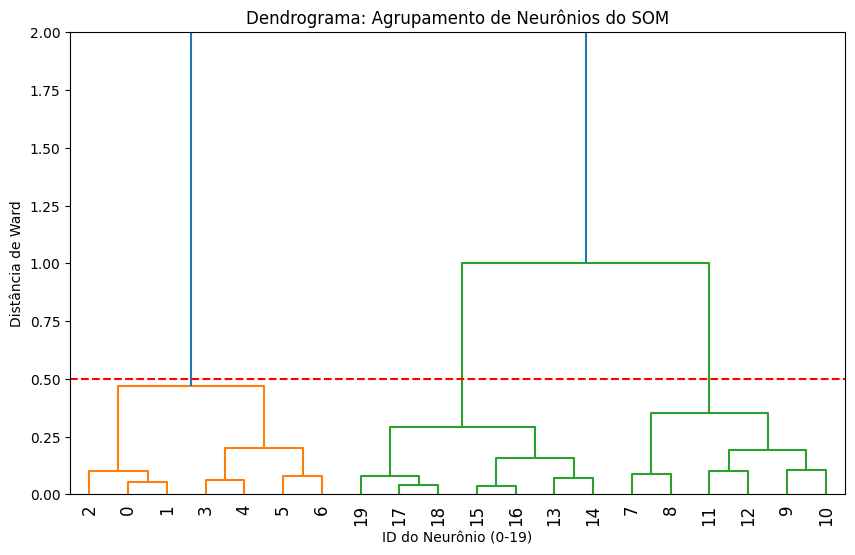

In [7]:
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering

# 1. Extrair os pesos (codebook vectors) do SOM 4x5
# weights terá formato (20, n_features)
#weights = som.get_weights().reshape(-1, data_to_som.shape[1])

# 2. Gerar a Linkage Matrix (usando o método de Ward para minimizar a variância)
centroids = df_processed[['kt', 'fracao_difusa', 'cluster']].loc[df_processed['mask']==1].groupby('cluster').agg({
    'kt':['mean','var'],
    'fracao_difusa':['mean','var']
}).values
Z = linkage(centroids, method='ward')

# 3. Plotar o Dendrograma para decisão do "corte"
plt.figure(figsize=(10, 6))
dendrogram(Z, leaf_rotation=90., leaf_font_size=12.)
plt.title('Dendrograma: Agrupamento de Neurônios do SOM')
plt.xlabel('ID do Neurônio (0-19)')
plt.ylabel('Distância de Ward')
plt.axhline(y=0.5, color='r', linestyle='--') # Linha hipotética de corte
plt.ylim(0,2)
plt.show()

# 4. Executar o agrupamento final (exemplo: reduzindo para 5 Super-Clusters)
n_super_clusters = 9
hac = AgglomerativeClustering(n_clusters=n_super_clusters, linkage='ward')
super_labels = hac.fit_predict(centroids)

In [8]:
# 5. Mapear os dias originais para os novos Super-Clusters
# Criamos um dicionário: ID_Neurônio -> ID_SuperCluster
mapping_dict = {i: label for i, label in enumerate(super_labels)}

new_cluster = [0]
index = 0

for i in range (1,20):
    if mapping_dict[i] == mapping_dict[i-1]:
        new_cluster.append(index)

    else:
        index += 1
        new_cluster.append(index)

# 3. Gerar o mapping_dict FINAL e organizado
mapping_dict_correto = {i: label for i, label in enumerate(new_cluster)}

# No seu dataframe original (daily_features), criamos a nova coluna
df_processed['super_cluster'] = df_processed['cluster'].map(mapping_dict_correto)

print(df_processed['super_cluster'].loc[df_processed['mask'] == 1].value_counts())

super_cluster
0    4559
7    3225
1    3063
6    3027
8    2662
5    2310
4    2293
2    1921
3    1851
Name: count, dtype: int64


In [17]:
#df_processed[['super_cluster', 'cluster']].loc[df_processed['mask'] == 1].groupby(['super_cluster','cluster']).agg({'cluster':['count']})

### Probabilidades

In [ ]:
dados_filtrados = df_processed[df_processed['mask'] == 1].copy()

df_sequencia = pd.DataFrame({
    't': dados_filtrados['super_cluster'],
    'tempo_t': dados_filtrados.index 
})

df_sequencia['t+1'] = df_sequencia['t'].shift(-1)
df_sequencia['tempo_t1'] = df_sequencia['tempo_t'].shift(-1)


df_sequencia = df_sequencia.dropna()

df_sequencia = df_sequencia[ (df_sequencia['tempo_t1'] - df_sequencia['tempo_t']) == datetime.timedelta(hours = 1) ]

df_sequencia['t+1'] = df_sequencia['t+1'].astype(int)

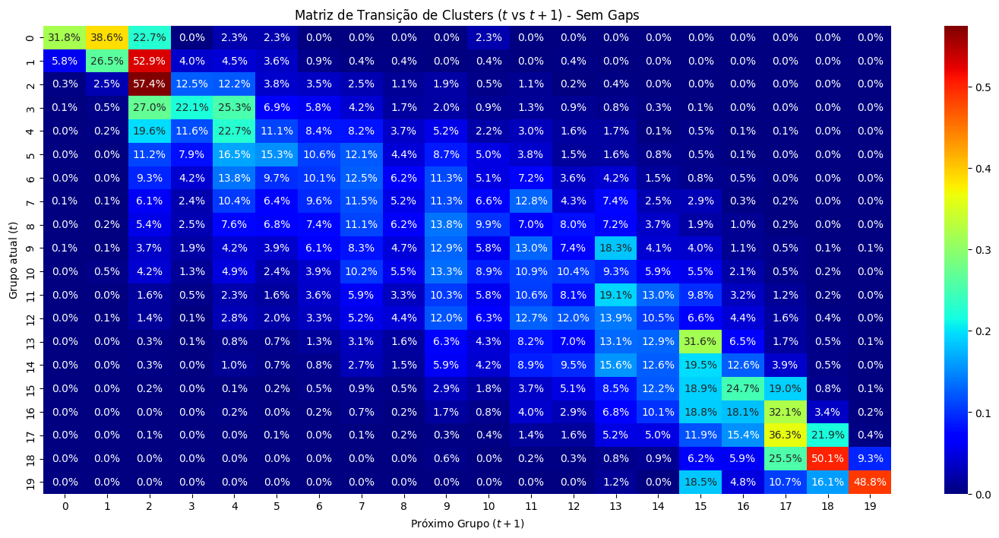

In [62]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Filtramos os dados com base na máscara original
dados_filtrados = df_processed[df_processed['mask'] == 1].copy()

# Criamos o DataFrame com o estado atual (t) e a sua respectiva marcação de tempo.
# ASSUNÇÃO: Estamos usando o índice (.index) como referência de tempo sequencial (ex: 0, 1, 2...).
# Se o seu tempo for uma coluna específica, troque `dados_filtrados.index` por `dados_filtrados['sua_coluna_de_data']`.
df_sequencia = pd.DataFrame({
    't': dados_filtrados['cluster'],
    'tempo_t': dados_filtrados.index 
})

# 2. Deslocamos os dados uma linha para cima para pegar o próximo cluster E o próximo tempo
df_sequencia['t+1'] = df_sequencia['t'].shift(-1)
df_sequencia['tempo_t1'] = df_sequencia['tempo_t'].shift(-1)

# A última linha ficará vazia (NaN), removemos
df_sequencia = df_sequencia.dropna()

# ---------------------------------------------------------
# 3. VERIFICAÇÃO DE GAPS (O Pulo do Gato)
# Mantemos apenas as transições onde o tempo seguinte é exatamente t+1.
# Se o seu índice for puramente numérico (0, 1, 2...):
df_sequencia = df_sequencia[ (df_sequencia['tempo_t1'] - df_sequencia['tempo_t']) == datetime.timedelta(hours = 1) ]

# NOTA: Se a sua referência de tempo for do tipo Datetime (datas reais) 
# e o salto correto for de 1 dia, use esta linha em vez da de cima:
# df_sequencia = df_sequencia[ (df_sequencia['tempo_t1'] - df_sequencia['tempo_t']).dt.days == 1 ]
# ---------------------------------------------------------

# Voltamos a coluna t+1 para inteiro
df_sequencia['t+1'] = df_sequencia['t+1'].astype(int)

# 4. Criar a Matriz de Transição usando crosstab
matriz_transicao = pd.crosstab(df_sequencia['t'], df_sequencia['t+1'], normalize='index')

# 5. Visualizar com um Heatmap
plt.figure(figsize=(18, 8))
sns.heatmap(matriz_transicao, annot=True, fmt='.1%', cmap='jet')

plt.title('Matriz de Transição de Clusters ($t$ vs $t+1$) - Sem Gaps')
plt.ylabel('Grupo atual ($t$)')
plt.xlabel('Próximo Grupo ($t+1$)')
plt.show()

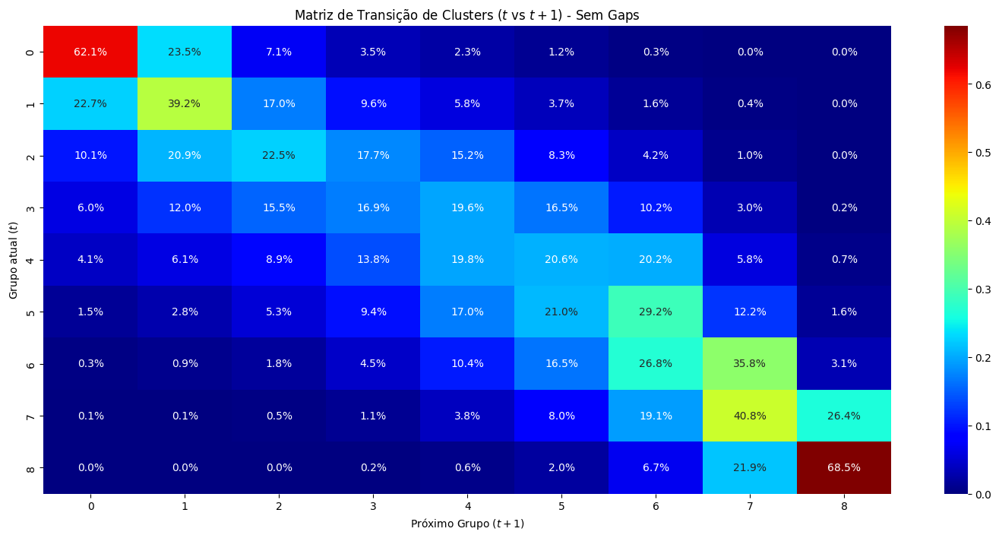

In [63]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Filtramos os dados com base na máscara original
dados_filtrados = df_processed[df_processed['mask'] == 1].copy()

# Criamos o DataFrame com o estado atual (t) e a sua respectiva marcação de tempo.
# ASSUNÇÃO: Estamos usando o índice (.index) como referência de tempo sequencial (ex: 0, 1, 2...).
# Se o seu tempo for uma coluna específica, troque `dados_filtrados.index` por `dados_filtrados['sua_coluna_de_data']`.
df_sequencia = pd.DataFrame({
    't': dados_filtrados['super_cluster'],
    'tempo_t': dados_filtrados.index 
})

# 2. Deslocamos os dados uma linha para cima para pegar o próximo cluster E o próximo tempo
df_sequencia['t+1'] = df_sequencia['t'].shift(-1)
df_sequencia['tempo_t1'] = df_sequencia['tempo_t'].shift(-1)

# A última linha ficará vazia (NaN), removemos
df_sequencia = df_sequencia.dropna()

# ---------------------------------------------------------
# 3. VERIFICAÇÃO DE GAPS (O Pulo do Gato)
# Mantemos apenas as transições onde o tempo seguinte é exatamente t+1.
# Se o seu índice for puramente numérico (0, 1, 2...):
df_sequencia = df_sequencia[ (df_sequencia['tempo_t1'] - df_sequencia['tempo_t']) == datetime.timedelta(hours = 1) ]

# NOTA: Se a sua referência de tempo for do tipo Datetime (datas reais) 
# e o salto correto for de 1 dia, use esta linha em vez da de cima:
# df_sequencia = df_sequencia[ (df_sequencia['tempo_t1'] - df_sequencia['tempo_t']).dt.days == 1 ]
# ---------------------------------------------------------

# Voltamos a coluna t+1 para inteiro
df_sequencia['t+1'] = df_sequencia['t+1'].astype(int)

# 4. Criar a Matriz de Transição usando crosstab
matriz_transicao = pd.crosstab(df_sequencia['t'], df_sequencia['t+1'], normalize='index')

# 5. Visualizar com um Heatmap
plt.figure(figsize=(18, 8))
sns.heatmap(matriz_transicao, annot=True, fmt='.1%', cmap='jet')

plt.title('Matriz de Transição de Clusters ($t$ vs $t+1$) - Sem Gaps')
plt.ylabel('Grupo atual ($t$)')
plt.xlabel('Próximo Grupo ($t+1$)')
plt.show()

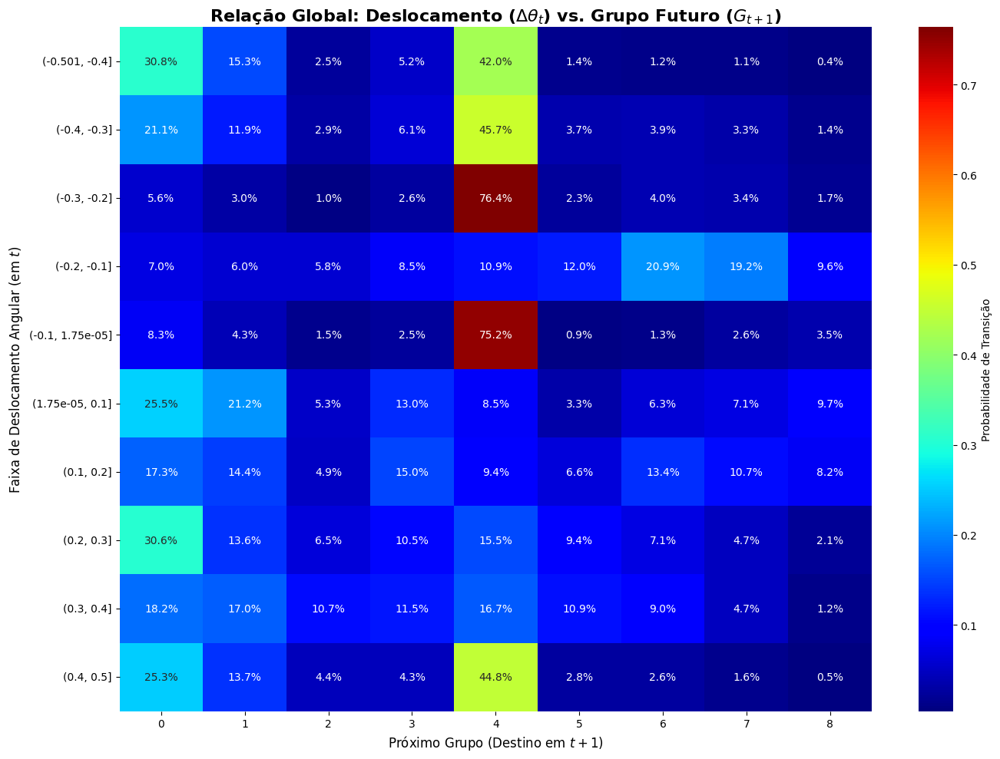

In [19]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# 1. Preparação dos dados (Shift para pegar o grupo futuro)
# Certifique-se de que os dados estão ordenados cronologicamente antes do shift
df_processed['next_group'] = df_processed['super_cluster'].shift(-1)

# 2. Criar faixas para o delta_theta
# Aumentei para 10 bins para uma análise mais detalhada da base toda
df_processed['delta_theta_bin'] = pd.cut(df_processed['delta_theta'], bins=10)

# 3. Limpeza de NaNs gerados pelo shift no final do dataset
df_final = df_processed.dropna(subset=['next_group', 'delta_theta_bin']).copy()
df_final['next_group'] = df_final['next_group'].astype(int)

# 4. Criação da Matriz de Probabilidade
# Linhas: Faixa de Deslocamento | Colunas: Grupo Destino
matriz_geral = pd.crosstab(
    df_final['delta_theta_bin'], 
    df_final['next_group'], 
    normalize='index'
)

# 5. Plotagem Única
plt.figure(figsize=(14, 10))
sns.heatmap(
    matriz_geral, 
    annot=True, 
    fmt='.1%', 
    cmap='jet', 
    cbar_kws={'label': 'Probabilidade de Transição'}
)

plt.title('Relação Global: Deslocamento ($\Delta\\theta_t$) vs. Grupo Futuro ($G_{t+1}$)', fontsize=16, fontweight='bold')
plt.xlabel('Próximo Grupo (Destino em $t+1$)', fontsize=12)
plt.ylabel('Faixa de Deslocamento Angular (em $t$)', fontsize=12)
plt.tight_layout()
plt.show()

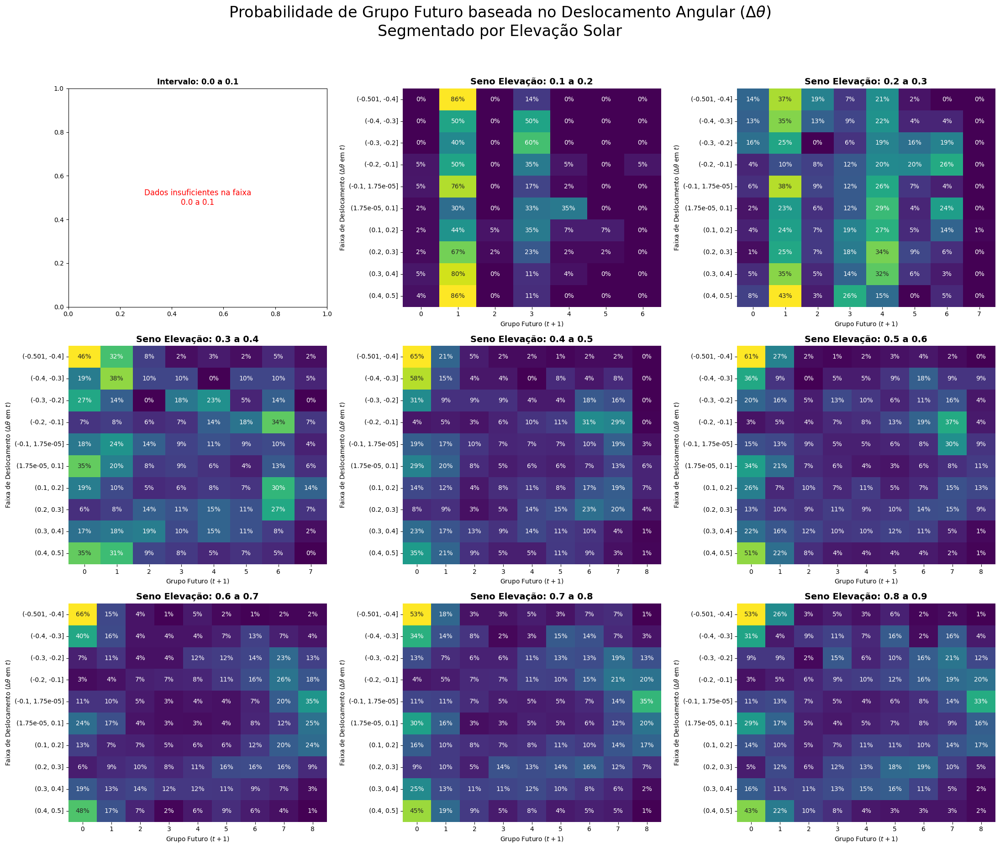

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# --- Preparação Prévia dos Dados ---

# 1. Criar a coluna do grupo futuro (t+1)
# Isso permite correlacionar o que aconteceu no momento 't' com o destino no momento 't+1'
df_processed['next_group'] = df_processed['super_cluster'].shift(-1)

# 2. Criar faixas (bins) para o delta_theta
# Aqui dividimos o deslocamento em, por exemplo, 8 intervalos. 
# Você pode ajustar o número de bins ou definir intervalos manuais com bins=[0, 45, 90...]
df_processed['delta_theta_bin'] = pd.cut(df_processed['delta_theta'], bins=10)

# -----------------------------------

# Mantemos a lógica de subplots por faixa de elevação solar, pois o comportamento
# do deslocamento pode variar dependendo da posição do sol.
start_points = np.arange(0.0, 0.9, 0.1)

fig, axes = plt.subplots(3, 3, figsize=(22, 18))
axes_flat = axes.flatten()

for i, lower in enumerate(start_points):
    ax = axes_flat[i]
    upper = lower + 0.1 
    
    # Filtragem por intervalo de Elevação Solar (conforme seu original)
    df_temp = df_processed.loc[
        (df_processed['mask'] == 1) & 
        (df_processed['delta_theta'] >= lower) & 
        (df_processed['sin_elevation'] < upper)
    ].copy()
    
    # Verificação de dados
    if df_temp.empty or len(df_temp) < 5: # Aumentei um pouco o limite para ter estatística
        ax.text(0.5, 0.5, f'Dados insuficientes na faixa\n{lower:.1f} a {upper:.1f}', 
                ha='center', va='center', fontsize=12, color='red')
        ax.set_title(f'Intervalo: {lower:.1f} a {upper:.1f}', fontsize=12, fontweight='bold')
        continue

    # Remover o último registro de cada faixa (que terá next_group como NaN devido ao shift)
    df_temp = df_temp.dropna(subset=['next_group', 'delta_theta_bin'])

    if not df_temp.empty:
        # Garantir que o grupo futuro seja tratado como inteiro para o eixo X
        df_temp['next_group'] = df_temp['next_group'].astype(int)

        # CRIAÇÃO DA MATRIZ: Deslocamento (t) vs Grupo Futuro (t+1)
        # O normalize='index' faz com que cada linha some 100%, mostrando a probabilidade
        # de ir para cada grupo dado aquele deslocamento específico.
        matriz_relacao = pd.crosstab(
            df_temp['delta_theta_bin'], 
            df_temp['next_group'], 
            normalize='index'
        )

        # Plot do Heatmap
        sns.heatmap(matriz_relacao, annot=True, fmt='.0%', cmap='viridis', ax=ax, cbar=False)
    
    ax.set_title(f'Seno Elevação: {lower:.1f} a {upper:.1f}', fontsize=14, fontweight='bold')
    ax.set_ylabel('Faixa de Deslocamento ($\Delta\\theta$ em $t$)')
    ax.set_xlabel('Grupo Futuro ($t+1$)')

plt.suptitle('Probabilidade de Grupo Futuro baseada no Deslocamento Angular ($\Delta\\theta$)\nSegmentado por Elevação Solar', 
             fontsize=24, y=1.03)
plt.tight_layout()
plt.show()

In [24]:
df_sequencia

,t,t+1
Date_Time,,
2015-06-19 15:00:00-03:00,1,4
2015-06-20 12:00:00-03:00,4,0
2015-07-01 14:00:00-03:00,0,1
2015-07-02 12:00:00-03:00,1,0
2015-07-02 13:00:00-03:00,0,0
...,...,...
2022-12-28 16:00:00-03:00,1,0
2022-12-28 18:00:00-03:00,0,2
2022-12-29 12:00:00-03:00,2,0


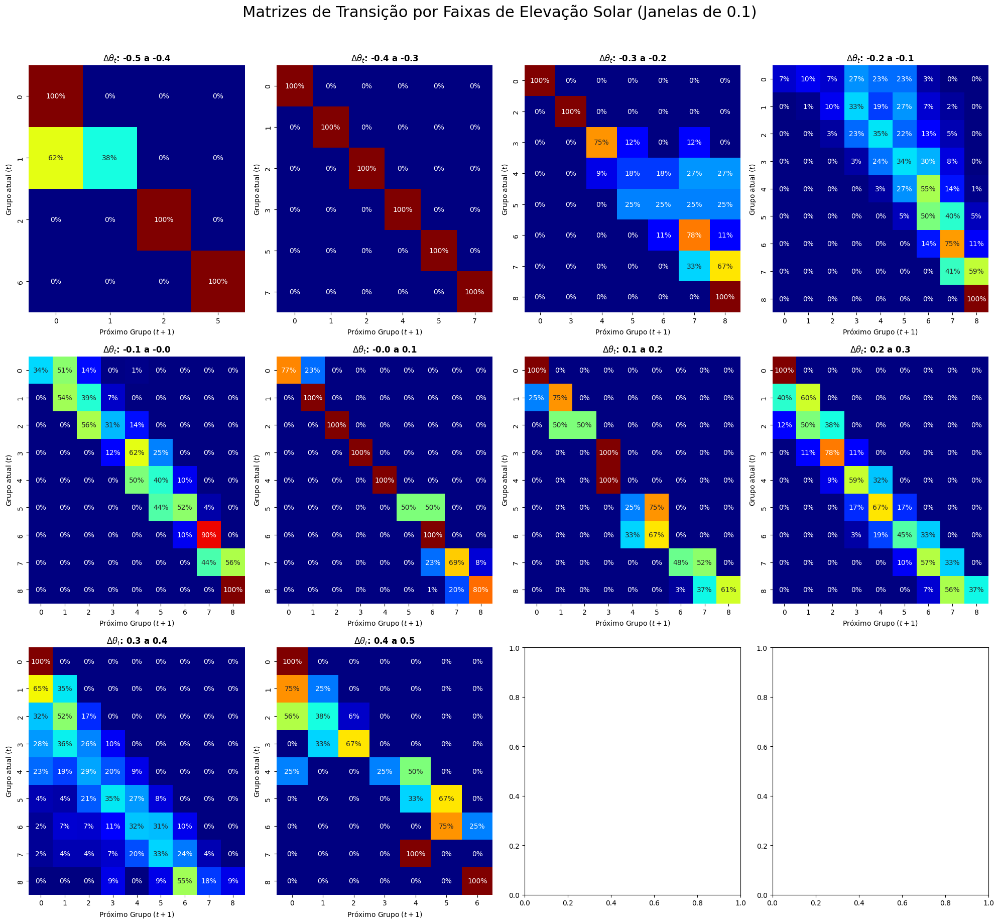

In [66]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# 1. Definimos os pontos de início de cada faixa (0.0, 0.1, 0.2 ... 0.8)
# Isso nos dará exatamente 9 intervalos para a grade 3x3
start_points = np.arange(-0.5, 0.5, 0.1)

fig, axes = plt.subplots(3, 4, figsize=(20, 18))
axes_flat = axes.flatten()

for i, lower in enumerate(start_points):
    ax = axes_flat[i]
    upper = lower + 0.1  # Define o limite superior da faixa atual
    
    # 2. Filtragem por INTERVALO (entre lower e upper)
    df_temp = df_processed.loc[
        (df_processed['mask'] == 1) & 
        (df_processed['delta_theta'] >= lower) & 
        (df_processed['delta_theta'] < upper)
    ].copy()
    
    # Verificação de dados vazios (crucial para janelas pequenas)
    if df_temp.empty or len(df_temp) < 2:
        ax.text(0.5, 0.5, f'Sem dados na faixa\n{lower:.1f} a {upper:.1f}', 
                ha='center', va='center', fontsize=12, color='red')
        ax.set_title(f'Intervalo: {lower:.1f} a {upper:.1f}', fontsize=12, fontweight='bold')
        continue

    # Criamos a sequência temporal
    dados_filtrados = df_temp[df_temp['mask'] == 1].copy()

    df_sequencia = pd.DataFrame({
        't': dados_filtrados['super_cluster'],
        'tempo_t': dados_filtrados.index 
    })

    df_sequencia['t+1'] = df_sequencia['t'].shift(-1)
    df_sequencia['tempo_t1'] = df_sequencia['tempo_t'].shift(-1)

    df_sequencia = df_sequencia.dropna()
    df_sequencia = df_sequencia[ (df_sequencia['tempo_t1'] - df_sequencia['tempo_t']) == datetime.timedelta(hours = 1) ]
    df_sequencia['t+1'] = df_sequencia['t+1'].astype(int)

    # Matriz de transição
    matriz_transicao = pd.crosstab(df_sequencia['t'], df_sequencia['t+1'], normalize='index')

    # Heatmap
    sns.heatmap(matriz_transicao, annot=True, fmt='.0%', cmap='jet', ax=ax, cbar=False)
    
    # Título indicando o intervalo específico
    ax.set_title(f'$\Delta\\theta_t$: {lower:.1f} a {upper:.1f}', fontsize=12, fontweight='bold')
    ax.set_ylabel('Grupo atual ($t$)')
    ax.set_xlabel('Próximo Grupo ($t+1$)')

plt.suptitle('Matrizes de Transição por Faixas de Elevação Solar (Janelas de 0.1)', fontsize=22, y=1.02)
plt.tight_layout()
plt.show()

#### Variando elevação solar

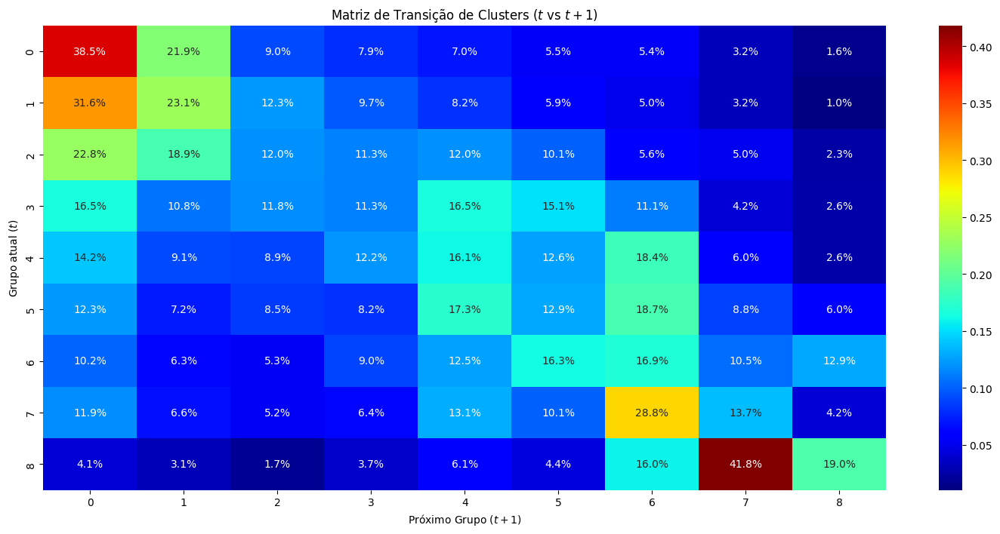

In [12]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Supondo que você tenha seus labels ordenados pelo tempo
# Pode ser os 20 clusters originais ou os macro-clusters finais
# labels_tempo = [0, 1, 1, 0, 0, 1, ...] 


# Criamos um DataFrame com o estado atual (t)
df_sequencia = pd.DataFrame({'t': df_processed['super_cluster'].loc[(df_processed['mask'] == 1) &
                                                                    (df_processed['sin_elevation'] <= 0.5)]})

# 2. Criamos a coluna (t+1) deslocando os dados uma linha para cima (shift)
df_sequencia['t+1'] = df_sequencia['t'].shift(-1)

# A última linha ficará vazia (NaN) no t+1, então nós a removemos
df_sequencia = df_sequencia.dropna()

# Como o shift transforma para float por causa do NaN, voltamos para int
df_sequencia['t+1'] = df_sequencia['t+1'].astype(int)

# 3. Criar a Matriz de Transição usando crosstab
# O primeiro argumento vai para o eixo Y (t), o segundo para o eixo X (t+1)
matriz_transicao = pd.crosstab(df_sequencia['t'], df_sequencia['t+1'], normalize='index')

# 4. Visualizar com um Heatmap para facilitar a análise
plt.figure(figsize=(18, 8))
# annot=True mostra os números dentro dos quadrados, cmap define a cor
sns.heatmap(matriz_transicao, annot=True, fmt='.1%', cmap='jet')

plt.title('Matriz de Transição de Clusters ($t$ vs $t+1$)')
plt.ylabel('Grupo atual ($t$)')
plt.xlabel('Próximo Grupo ($t+1$)')
plt.show()

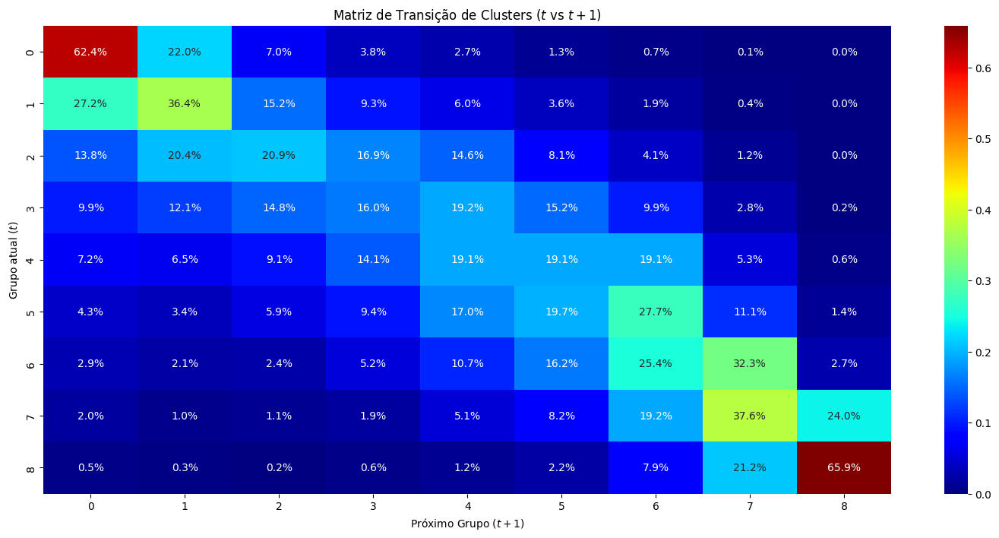

In [21]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Supondo que você tenha seus labels ordenados pelo tempo
# Pode ser os 20 clusters originais ou os macro-clusters finais
# labels_tempo = [0, 1, 1, 0, 0, 1, ...] 


# Criamos um DataFrame com o estado atual (t)
df_sequencia = pd.DataFrame({'t': df_processed['super_cluster'].loc[(df_processed['mask'] == 1) &
                                                                    (df_processed['sin_elevation']) >= 0.8]})

# 2. Criamos a coluna (t+1) deslocando os dados uma linha para cima (shift)
df_sequencia['t+1'] = df_sequencia['t'].shift(-1)

# A última linha ficará vazia (NaN) no t+1, então nós a removemos
df_sequencia = df_sequencia.dropna()

# Como o shift transforma para float por causa do NaN, voltamos para int
df_sequencia['t+1'] = df_sequencia['t+1'].astype(int)

# 3. Criar a Matriz de Transição usando crosstab
# O primeiro argumento vai para o eixo Y (t), o segundo para o eixo X (t+1)
matriz_transicao = pd.crosstab(df_sequencia['t'], df_sequencia['t+1'], normalize='index')

# 4. Visualizar com um Heatmap para facilitar a análise
plt.figure(figsize=(18, 8))
# annot=True mostra os números dentro dos quadrados, cmap define a cor
sns.heatmap(matriz_transicao, annot=True, fmt='.1%', cmap='jet')

plt.title('Matriz de Transição de Clusters ($t$ vs $t+1$)')
plt.ylabel('Grupo atual ($t$)')
plt.xlabel('Próximo Grupo ($t+1$)')
plt.show()

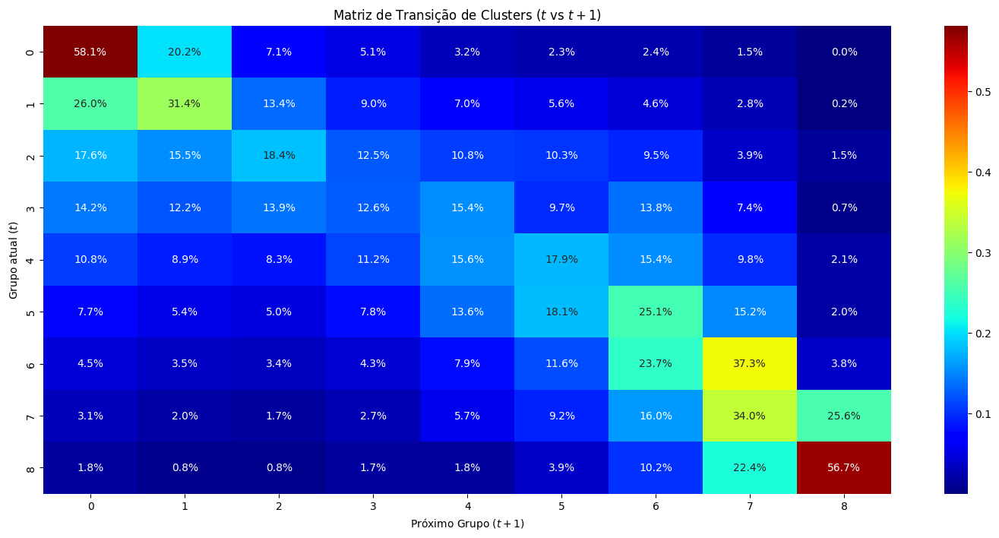

In [22]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Supondo que você tenha seus labels ordenados pelo tempo
# Pode ser os 20 clusters originais ou os macro-clusters finais
# labels_tempo = [0, 1, 1, 0, 0, 1, ...] 


# Criamos um DataFrame com o estado atual (t)
df_sequencia = pd.DataFrame({'t': df_processed['super_cluster'].loc[(df_processed['mask'] == 1) &
                                                                    ((df_processed['sin_elevation'] > 0.5) &
                                                                     (df_processed['sin_elevation'] < 0.8))]})

# 2. Criamos a coluna (t+1) deslocando os dados uma linha para cima (shift)
df_sequencia['t+1'] = df_sequencia['t'].shift(-1)

# A última linha ficará vazia (NaN) no t+1, então nós a removemos
df_sequencia = df_sequencia.dropna()

# Como o shift transforma para float por causa do NaN, voltamos para int
df_sequencia['t+1'] = df_sequencia['t+1'].astype(int)

# 3. Criar a Matriz de Transição usando crosstab
# O primeiro argumento vai para o eixo Y (t), o segundo para o eixo X (t+1)
matriz_transicao = pd.crosstab(df_sequencia['t'], df_sequencia['t+1'], normalize='index')

# 4. Visualizar com um Heatmap para facilitar a análise
plt.figure(figsize=(18, 8))
# annot=True mostra os números dentro dos quadrados, cmap define a cor
sns.heatmap(matriz_transicao, annot=True, fmt='.1%', cmap='jet')

plt.title('Matriz de Transição de Clusters ($t$ vs $t+1$)')
plt.ylabel('Grupo atual ($t$)')
plt.xlabel('Próximo Grupo ($t+1$)')
plt.show()

In [15]:
alpha_possibilities = np.arange(0.1, 1, 0.1)

In [17]:
len(alpha_possibilities)/3

3.0

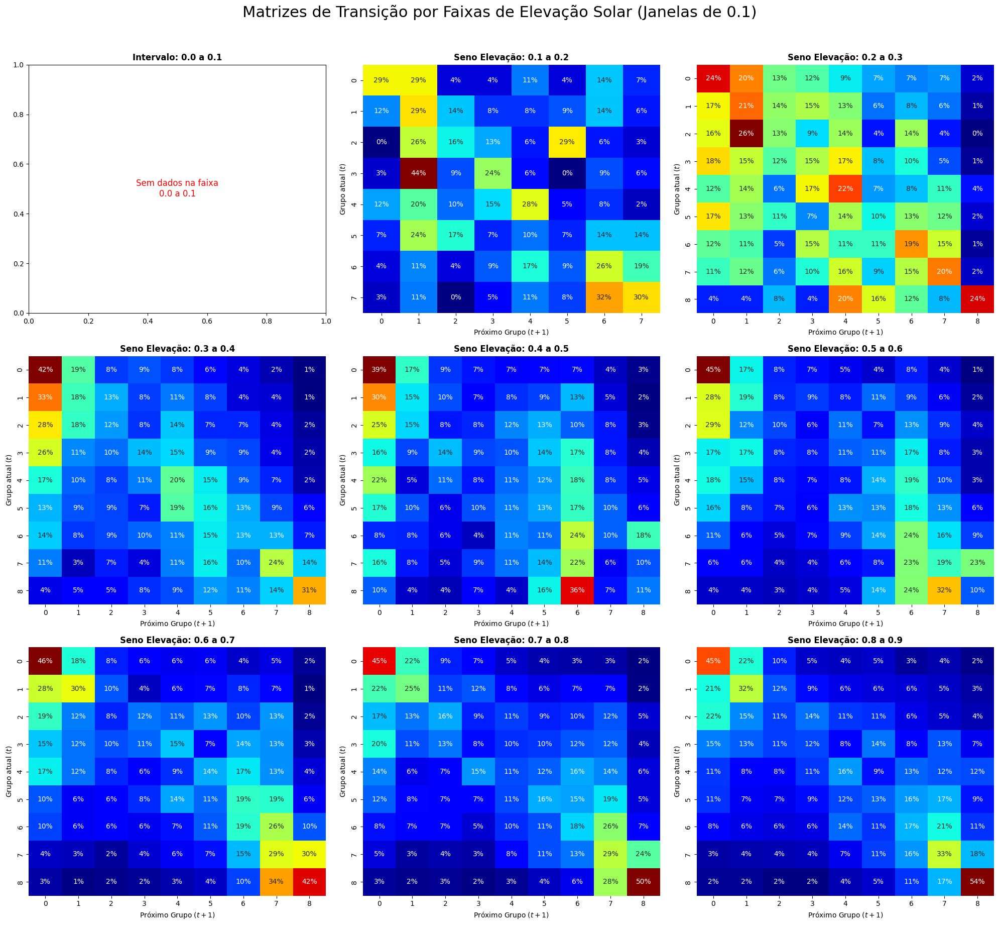

In [24]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# 1. Definimos os pontos de início de cada faixa (0.0, 0.1, 0.2 ... 0.8)
# Isso nos dará exatamente 9 intervalos para a grade 3x3
start_points = np.arange(0.0, 0.9, 0.1)

fig, axes = plt.subplots(3, 3, figsize=(20, 18))
axes_flat = axes.flatten()

for i, lower in enumerate(start_points):
    ax = axes_flat[i]
    upper = lower + 0.1  # Define o limite superior da faixa atual
    
    # 2. Filtragem por INTERVALO (entre lower e upper)
    df_temp = df_processed.loc[
        (df_processed['mask'] == 1) & 
        (df_processed['sin_elevation'] >= lower) & 
        (df_processed['sin_elevation'] < upper)
    ].copy()
    
    # Verificação de dados vazios (crucial para janelas pequenas)
    if df_temp.empty or len(df_temp) < 2:
        ax.text(0.5, 0.5, f'Sem dados na faixa\n{lower:.1f} a {upper:.1f}', 
                ha='center', va='center', fontsize=12, color='red')
        ax.set_title(f'Intervalo: {lower:.1f} a {upper:.1f}', fontsize=12, fontweight='bold')
        continue

    # Criamos a sequência temporal
    df_sequencia = pd.DataFrame({'t': df_temp['super_cluster']})
    df_sequencia['t+1'] = df_sequencia['t'].shift(-1)
    df_sequencia = df_sequencia.dropna()

    if not df_sequencia.empty:
        df_sequencia['t+1'] = df_sequencia['t+1'].astype(int)
        df_sequencia['t'] = df_sequencia['t'].astype(int)

        # Matriz de transição
        matriz_transicao = pd.crosstab(df_sequencia['t'], df_sequencia['t+1'], normalize='index')

        # Heatmap
        sns.heatmap(matriz_transicao, annot=True, fmt='.0%', cmap='jet', ax=ax, cbar=False)
    
    # Título indicando o intervalo específico
    ax.set_title(f'Seno Elevação: {lower:.1f} a {upper:.1f}', fontsize=12, fontweight='bold')
    ax.set_ylabel('Grupo atual ($t$)')
    ax.set_xlabel('Próximo Grupo ($t+1$)')

plt.suptitle('Matrizes de Transição por Faixas de Elevação Solar (Janelas de 0.1)', fontsize=22, y=1.02)
plt.tight_layout()
plt.show()

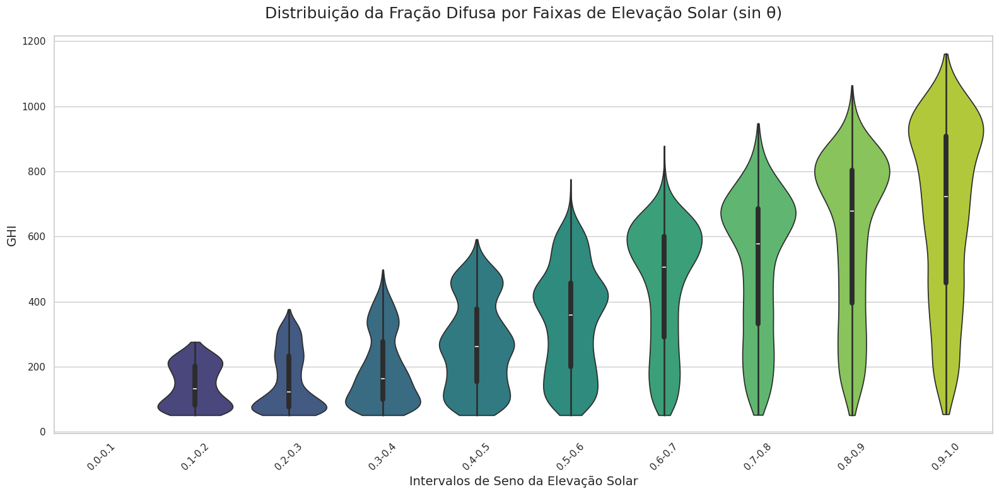

In [34]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# 1. Filtragem e preparação dos dados
# Filtramos apenas os dados válidos (mask == 1)
df_violin = df_processed.loc[df_processed['mask'] == 1].copy()

# 2. Criação das faixas (bins) de 0.1
# Criamos labels para facilitar a leitura no eixo X (ex: "0.0-0.1")
bins = np.arange(0, 1.1, 0.1)
labels = [f"{bins[i]:.1f}-{bins[i+1]:.1f}" for i in range(len(bins)-1)]

df_violin['faixa_elevacao'] = pd.cut(
    df_violin['sin_elevation'], 
    bins=bins, 
    labels=labels, 
    include_lowest=True
)

# 3. Configuração do gráfico
plt.figure(figsize=(16, 8))
sns.set_theme(style="whitegrid")

# Criando o Violin Plot
# No eixo Y, usei 'fracao_difusa' que é o padrão das suas análises anteriores
sns.violinplot(
    data=df_violin, 
    x='faixa_elevacao', 
    y='ghi', 
    palette='viridis', 
    #inner='quartile', # Mostra a mediana e os quartis dentro do violino
    cut=0             # Limita o violino aos dados existentes (não extrapola)
)

# 4. Estética e Detalhes
plt.title('Distribuição da Fração Difusa por Faixas de Elevação Solar (sin θ)', fontsize=18, pad=20)
plt.xlabel('Intervalos de Seno da Elevação Solar', fontsize=14)
plt.ylabel('GHI', fontsize=14)
plt.xticks(rotation=45) # Inclina os labels para não sobrepor
#plt.ylim(0, 1.1)        # Ajusta o limite da fração (0 a 1)

plt.tight_layout()
plt.show()

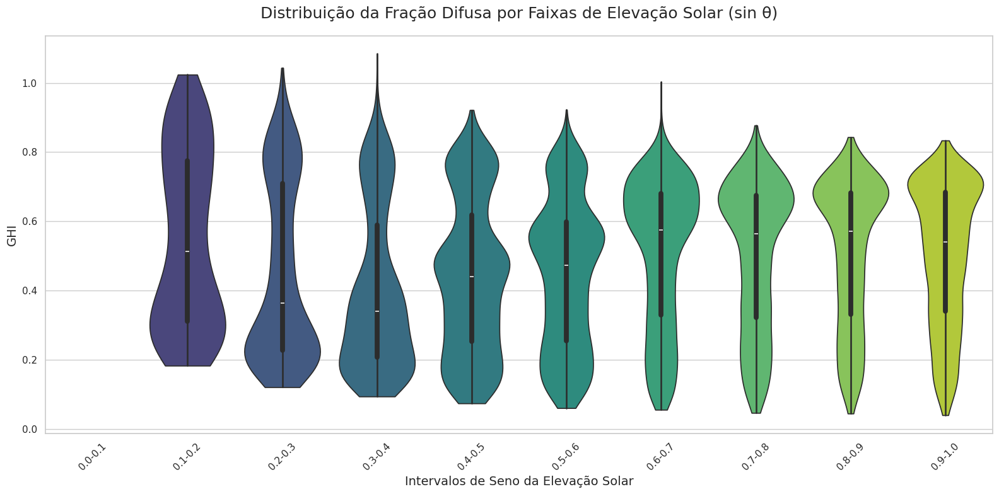

In [35]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# 1. Filtragem e preparação dos dados
# Filtramos apenas os dados válidos (mask == 1)
df_violin = df_processed.loc[df_processed['mask'] == 1].copy()

# 2. Criação das faixas (bins) de 0.1
# Criamos labels para facilitar a leitura no eixo X (ex: "0.0-0.1")
bins = np.arange(0, 1.1, 0.1)
labels = [f"{bins[i]:.1f}-{bins[i+1]:.1f}" for i in range(len(bins)-1)]

df_violin['faixa_elevacao'] = pd.cut(
    df_violin['sin_elevation'], 
    bins=bins, 
    labels=labels, 
    include_lowest=True
)

# 3. Configuração do gráfico
plt.figure(figsize=(16, 8))
sns.set_theme(style="whitegrid")

# Criando o Violin Plot
# No eixo Y, usei 'fracao_difusa' que é o padrão das suas análises anteriores
sns.violinplot(
    data=df_violin, 
    x='faixa_elevacao', 
    y='kt', 
    palette='viridis', 
    #inner='quartile', # Mostra a mediana e os quartis dentro do violino
    cut=0             # Limita o violino aos dados existentes (não extrapola)
)

# 4. Estética e Detalhes
plt.title('Distribuição da Fração Difusa por Faixas de Elevação Solar (sin θ)', fontsize=18, pad=20)
plt.xlabel('Intervalos de Seno da Elevação Solar', fontsize=14)
plt.ylabel('GHI', fontsize=14)
plt.xticks(rotation=45) # Inclina os labels para não sobrepor
#plt.ylim(0, 1.1)        # Ajusta o limite da fração (0 a 1)

plt.tight_layout()
plt.show()

In [29]:
df_processed.columns

Index(['target', 'ghi', 'irrad_poa', 'temp_amb', 'humidity', 'wind_speed',
       'Pressão Baromêtrica mm Hg', 'Pluviômetro mm', 'zenith',
       'apparent_zenith', 'azimuth', 'elevation', 'extra_rad', 'dni_extra',
       'am_abs', 'cos_zenith', 'sin_azimuth', 'ghi_extra', 'is_clear_moment',
       'is_clear_day', 'linke_turbidity_calc', 'dhi_cs', 'ghi_cs', 'dni_cs',
       'kt', 'direct_fraction', 'k', 'QS', 'VS_cdfn', 'temp_cell', 'pot_cs',
       'dhi', 'fracao_difusa', 'dni', 'mask', 'P_fracao_difusa', 'P_kt', 'P1',
       'P2', 'P3', 'irr_clearsky_ratio', 'sin_elevation', 'delta_kt',
       'delta_fracao_difusa', 'cloud_enh', 'QS2', 'QS3', 'delta_theta',
       'cluster', 'super_cluster'],
      dtype='object')

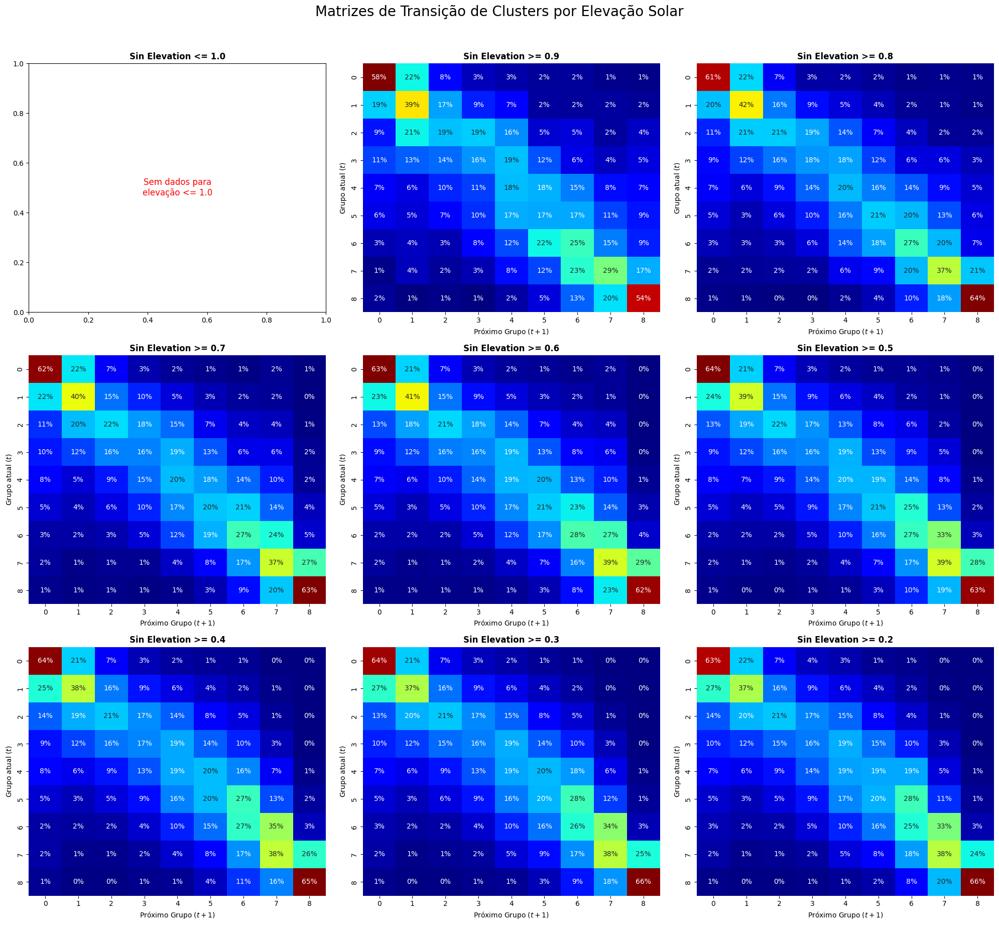

In [23]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

alpha_possibilities = np.arange(1, 0.1, -0.1)
fig, axes = plt.subplots(3, 3, figsize=(20, 18))
axes_flat = axes.flatten()

for i, alpha in enumerate(alpha_possibilities):
    ax = axes_flat[i]
    
    # Filtragem
    df_temp = df_processed.loc[(df_processed['mask'] == 1) & 
                               (df_processed['sin_elevation'] >= alpha)].copy()
    
    # --- VERIFICAÇÃO DE DADOS VAZIOS ---
    if df_temp.empty or len(df_temp) < 2:
        ax.text(0.5, 0.5, f'Sem dados para\nelevação <= {alpha:.1f}', 
                ha='center', va='center', fontsize=12, color='red')
        ax.set_title(f'Sin Elevation <= {alpha:.1f}', fontsize=12, fontweight='bold')
        continue # Pula para o próximo alpha
    # -----------------------------------

    df_sequencia = pd.DataFrame({'t': df_temp['super_cluster']})
    df_sequencia['t+1'] = df_sequencia['t'].shift(-1)
    df_sequencia = df_sequencia.dropna()

    if not df_sequencia.empty:
        df_sequencia['t+1'] = df_sequencia['t+1'].astype(int)
        df_sequencia['t'] = df_sequencia['t'].astype(int)

        matriz_transicao = pd.crosstab(df_sequencia['t'], df_sequencia['t+1'], normalize='index')

        # O erro acontecia aqui. Agora só desenha se a matriz tiver dados.
        sns.heatmap(matriz_transicao, annot=True, fmt='.0%', cmap='jet', ax=ax, cbar=False)
    
    ax.set_title(f'Sin Elevation >= {alpha:.1f}', fontsize=12, fontweight='bold')
    ax.set_ylabel('Grupo atual ($t$)')
    ax.set_xlabel('Próximo Grupo ($t+1$)')

plt.suptitle('Matrizes de Transição de Clusters por Elevação Solar', fontsize=20, y=1.02)
plt.tight_layout()
plt.show()

#### Scatter variando angulação solar

In [66]:
df_processed.loc[(df_processed['mask'] == 1) &
                           (df_processed['sin_elevation'] <= 0.5) &
                           (df_processed['super_cluster'] >= 8)]

,target,ghi,irrad_poa,temp_amb,humidity,wind_speed,Pressão Baromêtrica mm Hg,Pluviômetro mm,zenith,apparent_zenith,...,irr_clearsky_ratio,sin_elevation,delta_kt,delta_fracao_difusa,cloud_enh,QS2,QS3,cluster,super_cluster,delta_theta
Date_Time,,,,,,,,,,,,,,,,,,,,,
2015-06-13 15:00:00-03:00,0.000000,482.0,739.0,0.769352,0.3696,0.517891,438.70,0.0,62.878484,62.845871,...,1.533195,0.455879,0.060637,0.024882,1,0.812774,0.845024,17,8,0.061974
2015-06-20 15:00:00-03:00,0.000000,477.0,733.0,0.689004,0.5622,0.632298,438.70,0.0,62.785523,62.753037,...,1.536688,0.457323,0.022768,0.010546,0,0.821641,0.853647,18,8,0.069036
2015-06-21 15:00:00-03:00,0.000000,467.0,719.0,0.734320,0.4769,0.238230,438.70,0.0,62.752549,62.720108,...,1.539615,0.457834,0.016152,0.022825,0,0.808141,0.841705,17,8,0.151990
2015-06-22 15:00:00-03:00,0.000000,462.0,710.0,0.742683,0.3744,0.343691,438.70,0.0,62.714821,62.682432,...,1.536797,0.458420,0.028141,0.003767,0,0.807355,0.841482,18,8,0.021177
2015-06-27 15:00:00-03:00,0.000000,493.0,754.0,0.697367,0.4791,0.529661,438.70,0.0,62.456965,62.424924,...,1.529412,0.462415,0.030074,-0.009678,0,0.836099,0.866075,18,8,-0.049551
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-07-09 15:00:00-03:00,0.085700,506.0,741.0,0.743022,0.3659,0.137947,703.32,0.0,61.364203,61.333577,...,1.464427,0.479240,0.030244,0.004726,0,0.822757,0.854216,17,8,0.024671
2022-07-11 15:00:00-03:00,0.224314,518.0,751.0,0.740762,0.4103,0.511299,698.56,0.0,61.134439,61.104099,...,1.449807,0.482756,0.027771,0.039899,1,0.821627,0.852773,17,8,0.153225
2022-07-15 15:00:00-03:00,0.243379,505.0,730.0,0.766753,0.3628,0.480226,699.17,0.0,60.636884,60.607148,...,1.445545,0.490343,0.019737,-0.009198,0,0.803296,0.836116,17,8,-0.069408


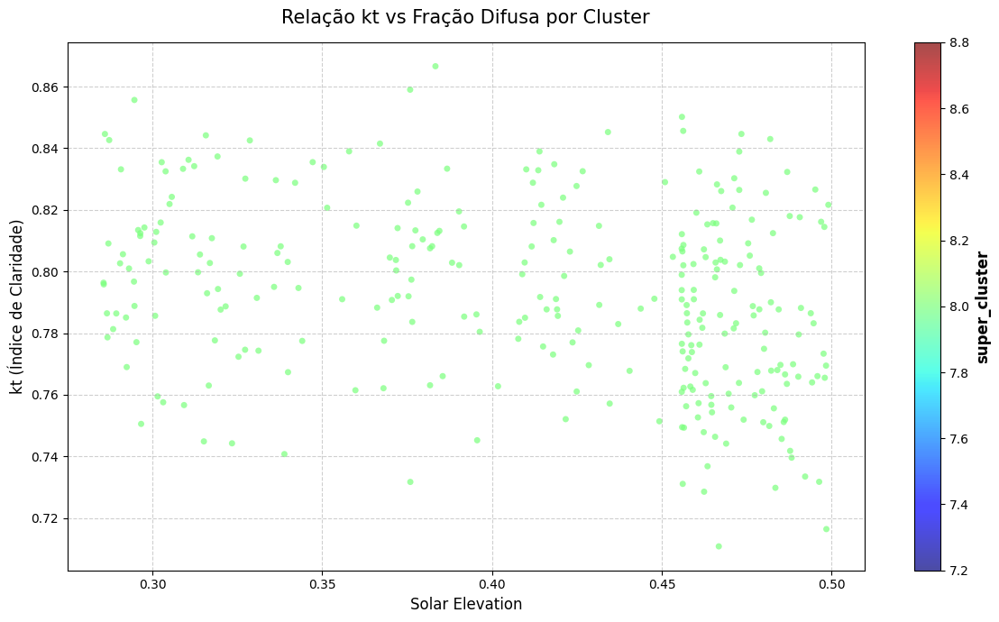

In [65]:
import matplotlib.pyplot as plt

# Filtragem dos dados
df_plot = df_processed.loc[(df_processed['mask'] == 1) &
                           (df_processed['sin_elevation'] <= 0.5) &
                           (df_processed['super_cluster'] >= 8)]

# Criando a figura e os eixos de forma explícita
fig, ax = plt.subplots(figsize=(12, 7))

# Plotando o scatter
# s=20 define o tamanho dos pontos, alpha a transparência para ver sobreposição
scatter = ax.scatter(
    data=df_plot, 
    x='sin_elevation', 
    y='kt', 
    c='super_cluster', 
    cmap='jet',      # 'jet' com 9 níveis pode ser passado direto ou via cm.get_cmap
    s=25, 
    alpha=0.7,
    edgecolors='none'
)

# Adicionando e configurando a barra de cores (colorbar)
cbar = fig.colorbar(scatter, ax=ax)
cbar.set_label('super_cluster', fontsize=12, fontweight='bold')

# Melhorando a estética do gráfico
ax.set_title('Relação kt vs Fração Difusa por Cluster', fontsize=15, pad=15)
ax.set_xlabel('Solar Elevation', fontsize=12)
ax.set_ylabel('kt (Índice de Claridade)', fontsize=12)
ax.grid(True, linestyle='--', alpha=0.6)

#ax.set_xlim(0,1.1)

plt.tight_layout()
plt.show()


In [ ]:
import matplotlib.pyplot as plt

# Filtragem
df_plot = df_processed.loc[(df_processed['mask'] == 1) &
                           (df_processed['cloud_enh'] == 0)]

fig = plt.figure(figsize=(12, 7))
ax = fig.add_subplot(projection='3d')

# No scatter 3D, passamos x, y, z como os 3 primeiros argumentos posicionais
scatter = ax.scatter(
    df_plot['kt'], 
    df_plot['fracao_difusa'], 
    df_plot['elevation'],
    c=df_plot['super_cluster'], 
    cmap='jet',
    s=25, 
    alpha=0.7,
    edgecolors='none'
)

# Colorbar
cbar = fig.colorbar(scatter, ax=ax, shrink=0.5, aspect=10) # shrink ajusta o tamanho da barra
cbar.set_label('Super Cluster', fontsize=12, fontweight='bold')

# Estética e Labels
ax.set_title('Relação kt vs Fração Difusa por Cluster', fontsize=15, pad=15)
ax.set_xlabel('kt (Índice de Claridade)')
ax.set_ylabel('Fração Difusa')
ax.set_zlabel('VS_cdfn') # Adicionado label para o eixo Z

# Limites e Grid
ax.set_xlim(0, 1.1)
# O grid no 3D funciona de forma diferente, o padrão do Matplotlib já é razoável
ax.view_init(elev = 30, azim =45)
plt.tight_layout()
plt.show()


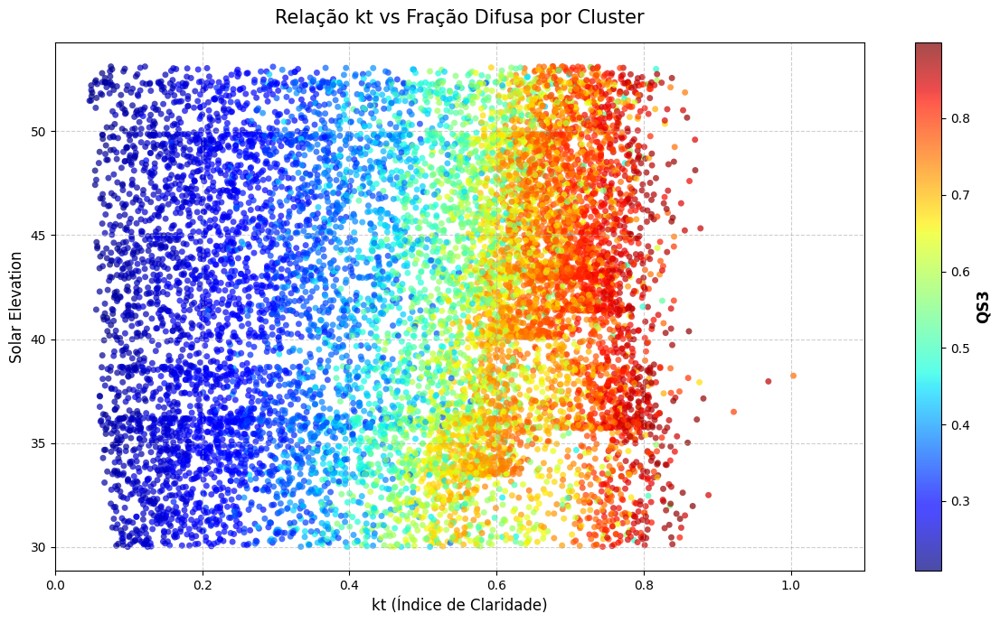

In [43]:
import matplotlib.pyplot as plt
import seaborn as sns

# Filtragem dos dados
df_plot = df_processed.loc[(df_processed['mask'] == 1) &
                           ((df_processed['sin_elevation'] > 0.5) &
                            (df_processed['sin_elevation'] < 0.8))]

# Criando a figura e os eixos de forma explícita
fig, ax = plt.subplots(figsize=(12, 7))

# Plotando o scatter
# s=20 define o tamanho dos pontos, alpha a transparência para ver sobreposição
scatter = ax.scatter(
    data=df_plot, 
    x='kt', 
    y='elevation', 
    c='QS3', 
    cmap='jet',      # 'jet' com 9 níveis pode ser passado direto ou via cm.get_cmap
    s=25, 
    alpha=0.7,
    edgecolors='none'
)

# Adicionando e configurando a barra de cores (colorbar)
cbar = fig.colorbar(scatter, ax=ax)
cbar.set_label('QS3', fontsize=12, fontweight='bold')

# Melhorando a estética do gráfico
ax.set_title('Relação kt vs Fração Difusa por Cluster', fontsize=15, pad=15)
ax.set_xlabel('kt (Índice de Claridade)', fontsize=12)
ax.set_ylabel('Solar Elevation', fontsize=12)
ax.grid(True, linestyle='--', alpha=0.6)

ax.set_xlim(0,1.1)

plt.tight_layout()
plt.show()


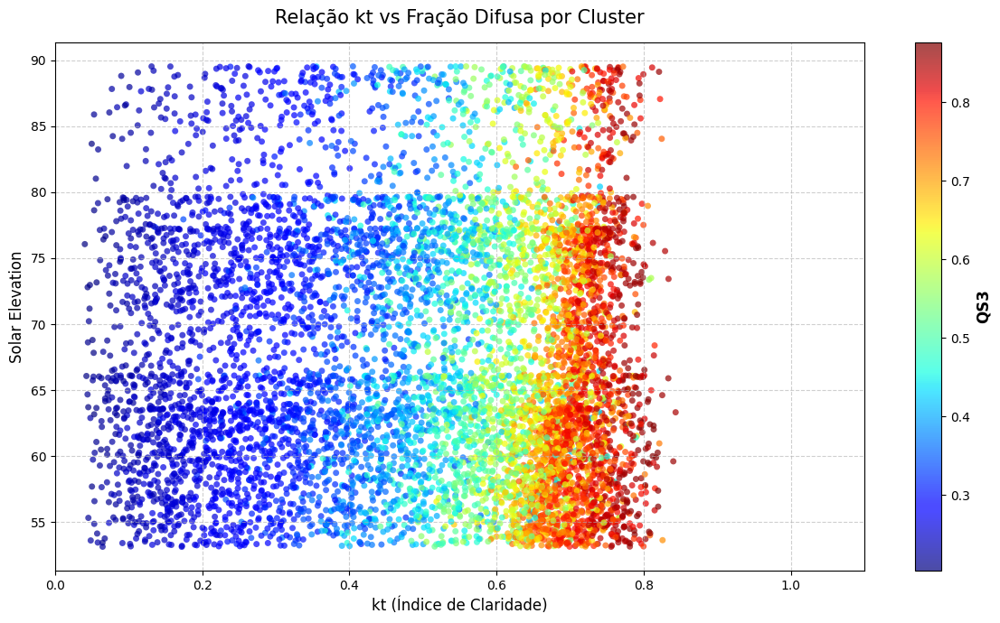

In [44]:
import matplotlib.pyplot as plt
import seaborn as sns

# Filtragem dos dados
df_plot = df_processed.loc[(df_processed['mask'] == 1) &
                           (df_processed['sin_elevation'] >= 0.8)]

# Criando a figura e os eixos de forma explícita
fig, ax = plt.subplots(figsize=(12, 7))

# Plotando o scatter
# s=20 define o tamanho dos pontos, alpha a transparência para ver sobreposição
scatter = ax.scatter(
    data=df_plot, 
    x='kt', 
    y='elevation', 
    c='QS3', 
    cmap='jet',      # 'jet' com 9 níveis pode ser passado direto ou via cm.get_cmap
    s=25, 
    alpha=0.7,
    edgecolors='none'
)

# Adicionando e configurando a barra de cores (colorbar)
cbar = fig.colorbar(scatter, ax=ax)
cbar.set_label('QS3', fontsize=12, fontweight='bold')

# Melhorando a estética do gráfico
ax.set_title('Relação kt vs Fração Difusa por Cluster', fontsize=15, pad=15)
ax.set_xlabel('kt (Índice de Claridade)', fontsize=12)
ax.set_ylabel('Solar Elevation', fontsize=12)
ax.grid(True, linestyle='--', alpha=0.6)

ax.set_xlim(0,1.1)

plt.tight_layout()
plt.show()


### Removendo Cloud Enhancement

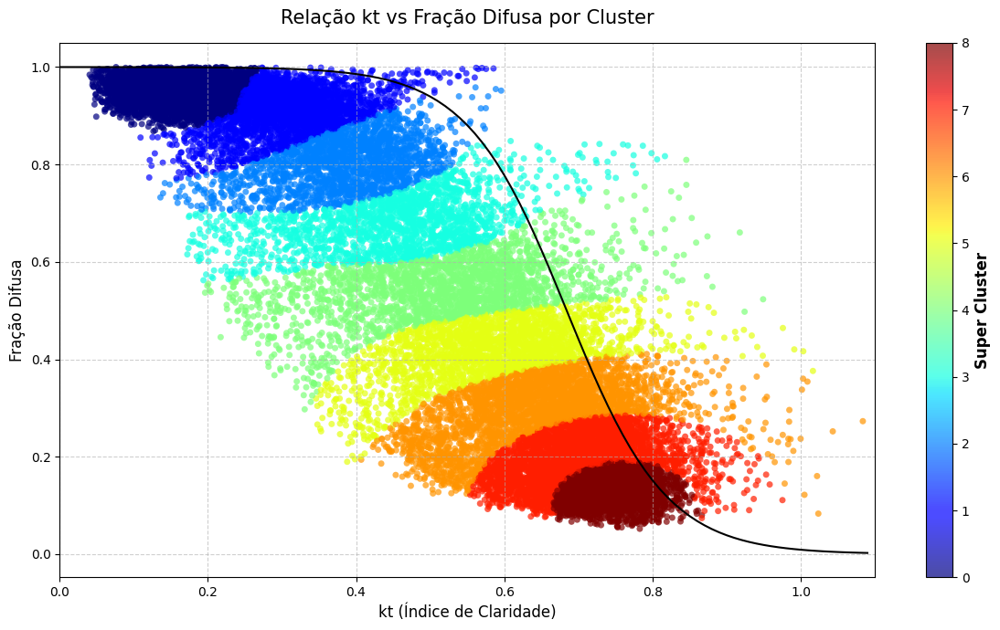

In [53]:
import matplotlib.pyplot as plt

# Filtragem dos dados
df_plot = df_processed.loc[df_processed['mask'] == 1]

# Criando a figura e os eixos de forma explícita
fig, ax = plt.subplots(figsize=(12, 7))

# Plotando o scatter
# s=20 define o tamanho dos pontos, alpha a transparência para ver sobreposição
scatter = ax.scatter(
    data=df_plot, 
    x='kt', 
    y='fracao_difusa', 
    c='super_cluster', 
    cmap='jet',      # 'jet' com 9 níveis pode ser passado direto ou via cm.get_cmap
    s=25, 
    alpha=0.7,
    edgecolors='none'
)

# Adicionando e configurando a barra de cores (colorbar)
cbar = fig.colorbar(scatter, ax=ax)
cbar.set_label('Super Cluster', fontsize=12, fontweight='bold')

ax.plot(
        np.arange(0,1.1, 0.01),
        (1 / (1 + np.exp(b0*np.arange(0,1.1, 0.01) - b1))),
        color='black')

# Melhorando a estética do gráfico
ax.set_title('Relação kt vs Fração Difusa por Cluster', fontsize=15, pad=15)
ax.set_xlabel('kt (Índice de Claridade)', fontsize=12)
ax.set_ylabel('Fração Difusa', fontsize=12)
ax.grid(True, linestyle='--', alpha=0.6)

ax.set_xlim(0,1.1)

plt.tight_layout()
plt.show()


In [29]:
df_processed['delta_kt']

Date_Time
2015-06-11 18:00:00-03:00    0.000000
2015-06-11 19:00:00-03:00    0.000000
2015-06-11 20:00:00-03:00    0.000000
2015-06-11 21:00:00-03:00    0.000000
2015-06-11 22:00:00-03:00    0.000000
                               ...   
2022-12-31 19:00:00-03:00   -0.274216
2022-12-31 20:00:00-03:00   -0.000000
2022-12-31 21:00:00-03:00    0.000000
2022-12-31 22:00:00-03:00    0.000000
2022-12-31 23:00:00-03:00    0.000000
Name: delta_kt, Length: 66242, dtype: float64

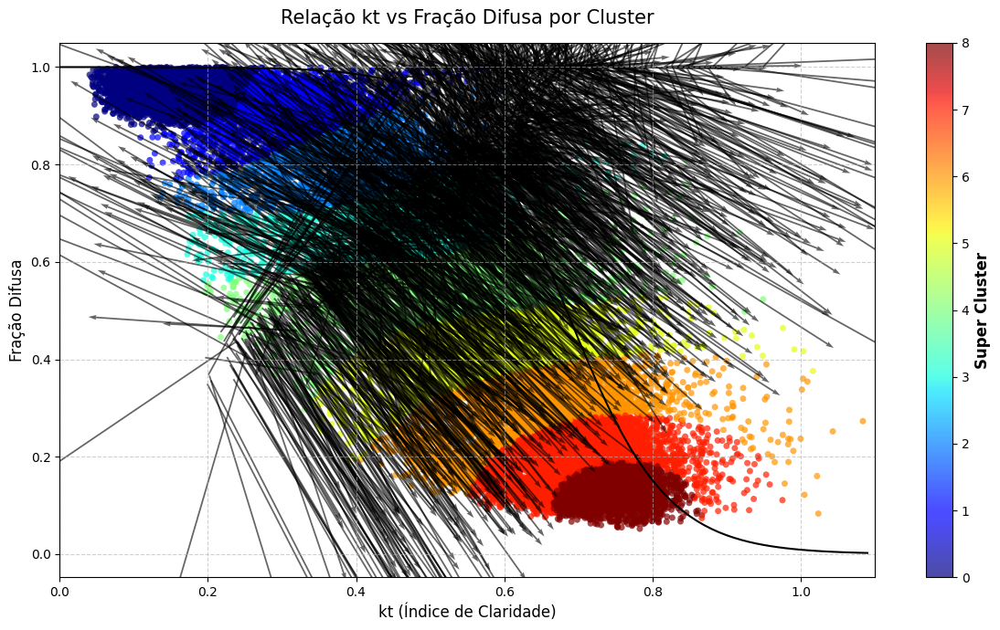

In [35]:
import matplotlib.pyplot as plt

# Filtragem dos dados
df_plot = df_processed.loc[df_processed['mask'] == 1]
df_seta = df_plot.loc[df_plot['super_cluster'] == 4]

# Criando a figura e os eixos de forma explícita
fig, ax = plt.subplots(figsize=(12, 7))

# Plotando o scatter
# s=20 define o tamanho dos pontos, alpha a transparência para ver sobreposição
scatter = ax.scatter(
    data=df_plot, 
    x='kt', 
    y='fracao_difusa', 
    c='super_cluster', 
    cmap='jet',      # 'jet' com 9 níveis pode ser passado direto ou via cm.get_cmap
    s=25, 
    alpha=0.7,
    edgecolors='none'
)

# Adicionando e configurando a barra de cores (colorbar)
cbar = fig.colorbar(scatter, ax=ax)
cbar.set_label('Super Cluster', fontsize=12, fontweight='bold')

ax.plot(
        np.arange(0,1.1, 0.01),
        (1 / (1 + np.exp(b0*np.arange(0,1.1, 0.01) - b1))),
        color='black')

U = df_seta['raio'] * np.cos(df_seta['delta_theta']*2*np.pi)
V = df_seta['raio'] * np.sin(df_seta['delta_theta']*2*np.pi)
ax.quiver(
    df_seta['kt'], df_seta['k'], 
           U,V,
           angles='xy', scale_units='xy', scale=1, 
           color='black', alpha=0.6, width=0.002,
)

# Melhorando a estética do gráfico
ax.set_title('Relação kt vs Fração Difusa por Cluster', fontsize=15, pad=15)
ax.set_xlabel('kt (Índice de Claridade)', fontsize=12)
ax.set_ylabel('Fração Difusa', fontsize=12)
ax.grid(True, linestyle='--', alpha=0.6)

ax.set_xlim(0,1.1)

plt.tight_layout()
plt.show()


In [34]:
df_seta[['kt', 'fracao_difusa', 'raio']]

,kt,fracao_difusa,raio
Date_Time,,,
2015-06-18 14:00:00-03:00,0.516716,0.593244,0.351400
2015-06-18 16:00:00-03:00,0.605874,0.570709,0.441306
2015-06-20 12:00:00-03:00,0.493984,0.569942,0.177768
2015-06-25 10:00:00-03:00,0.415608,0.526374,0.245346
2015-06-26 15:00:00-03:00,0.556125,0.490860,0.316080
...,...,...,...
2022-12-29 13:00:00-03:00,0.514301,0.553422,0.241730
2022-12-29 14:00:00-03:00,0.655543,0.563014,0.141567
2022-12-29 15:00:00-03:00,0.624201,0.505634,0.065382


In [32]:
df_seta['kt']

Date_Time
2015-06-18 14:00:00-03:00    0.516716
2015-06-18 16:00:00-03:00    0.605874
2015-06-20 12:00:00-03:00    0.493984
2015-06-25 10:00:00-03:00    0.415608
2015-06-26 15:00:00-03:00    0.556125
                               ...   
2022-12-29 13:00:00-03:00    0.514301
2022-12-29 14:00:00-03:00    0.655543
2022-12-29 15:00:00-03:00    0.624201
2022-12-31 12:00:00-03:00    0.395677
2022-12-31 13:00:00-03:00    0.526861
Name: kt, Length: 2293, dtype: float64

In [31]:
df_seta['kt'].shift(-1)

Date_Time
2015-06-18 14:00:00-03:00    0.605874
2015-06-18 16:00:00-03:00    0.493984
2015-06-20 12:00:00-03:00    0.415608
2015-06-25 10:00:00-03:00    0.556125
2015-06-26 15:00:00-03:00    0.578625
                               ...   
2022-12-29 13:00:00-03:00    0.655543
2022-12-29 14:00:00-03:00    0.624201
2022-12-29 15:00:00-03:00    0.395677
2022-12-31 12:00:00-03:00    0.526861
2022-12-31 13:00:00-03:00         NaN
Name: kt, Length: 2293, dtype: float64

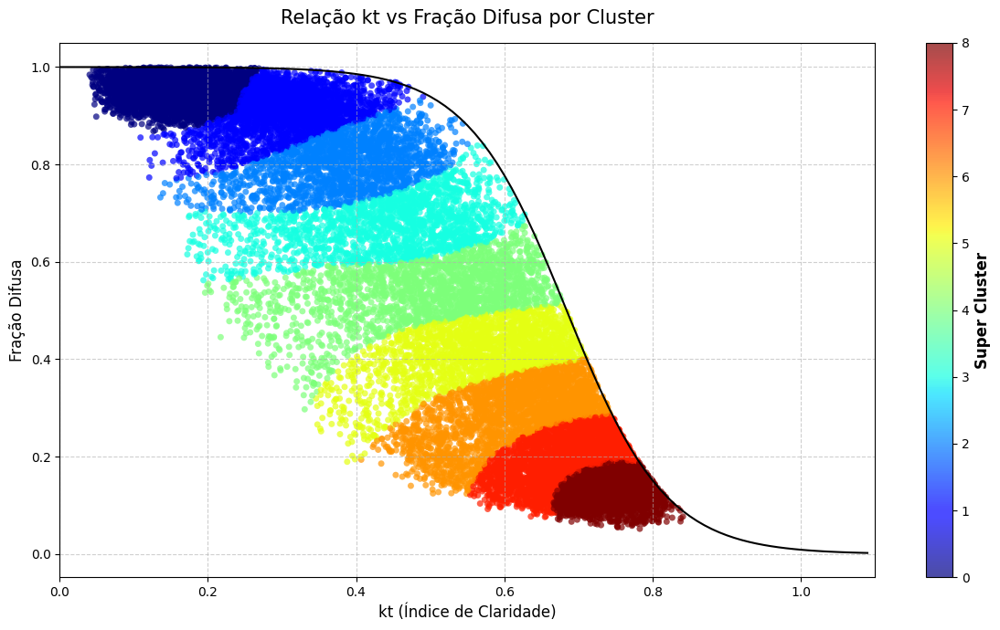

In [56]:
import matplotlib.pyplot as plt

# Filtragem dos dados
df_plot = df_processed.loc[(df_processed['mask'] == 1) &
                           (df_processed['cloud_enh'] == 0)]

# Criando a figura e os eixos de forma explícita
fig, ax = plt.subplots(figsize=(12, 7))

# Plotando o scatter
# s=20 define o tamanho dos pontos, alpha a transparência para ver sobreposição
scatter = ax.scatter(
    data=df_plot, 
    x='kt', 
    y='fracao_difusa', 
    c='super_cluster', 
    cmap='jet',      # 'jet' com 9 níveis pode ser passado direto ou via cm.get_cmap
    s=25, 
    alpha=0.7,
    edgecolors='none'
)

# Adicionando e configurando a barra de cores (colorbar)
cbar = fig.colorbar(scatter, ax=ax)
cbar.set_label('Super Cluster', fontsize=12, fontweight='bold')

ax.plot(
        np.arange(0,1.1, 0.01),
        (1 / (1 + np.exp(b0*np.arange(0,1.1, 0.01) - b1))),
        color='black')

# Melhorando a estética do gráfico
ax.set_title('Relação kt vs Fração Difusa por Cluster', fontsize=15, pad=15)
ax.set_xlabel('kt (Índice de Claridade)', fontsize=12)
ax.set_ylabel('Fração Difusa', fontsize=12)
ax.grid(True, linestyle='--', alpha=0.6)

ax.set_xlim(0,1.1)

plt.tight_layout()
plt.show()


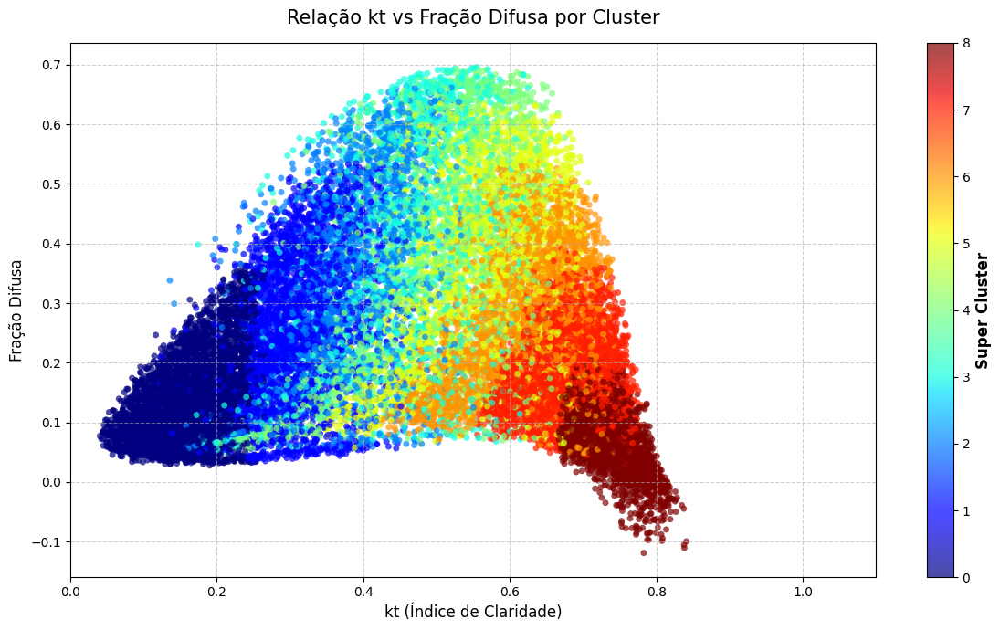

In [51]:
import matplotlib.pyplot as plt

# Filtragem dos dados
df_plot = df_processed.loc[(df_processed['mask'] == 1) &
                           (df_processed['cloud_enh'] == 0)]

# Criando a figura e os eixos de forma explícita
fig, ax = plt.subplots(figsize=(12, 7))

# Plotando o scatter
# s=20 define o tamanho dos pontos, alpha a transparência para ver sobreposição
scatter = ax.scatter(
    data=df_plot, 
    x='kt', 
    y='VS_cdfn', 
    c='super_cluster', 
    cmap='jet',      # 'jet' com 9 níveis pode ser passado direto ou via cm.get_cmap
    s=25, 
    alpha=0.7,
    edgecolors='none'
)

# Adicionando e configurando a barra de cores (colorbar)
cbar = fig.colorbar(scatter, ax=ax)
cbar.set_label('Super Cluster', fontsize=12, fontweight='bold')


# Melhorando a estética do gráfico
ax.set_title('Relação kt vs Fração Difusa por Cluster', fontsize=15, pad=15)
ax.set_xlabel('kt (Índice de Claridade)', fontsize=12)
ax.set_ylabel('Fração Difusa', fontsize=12)
ax.grid(True, linestyle='--', alpha=0.6)

ax.set_xlim(0,1.1)

plt.tight_layout()
plt.show()


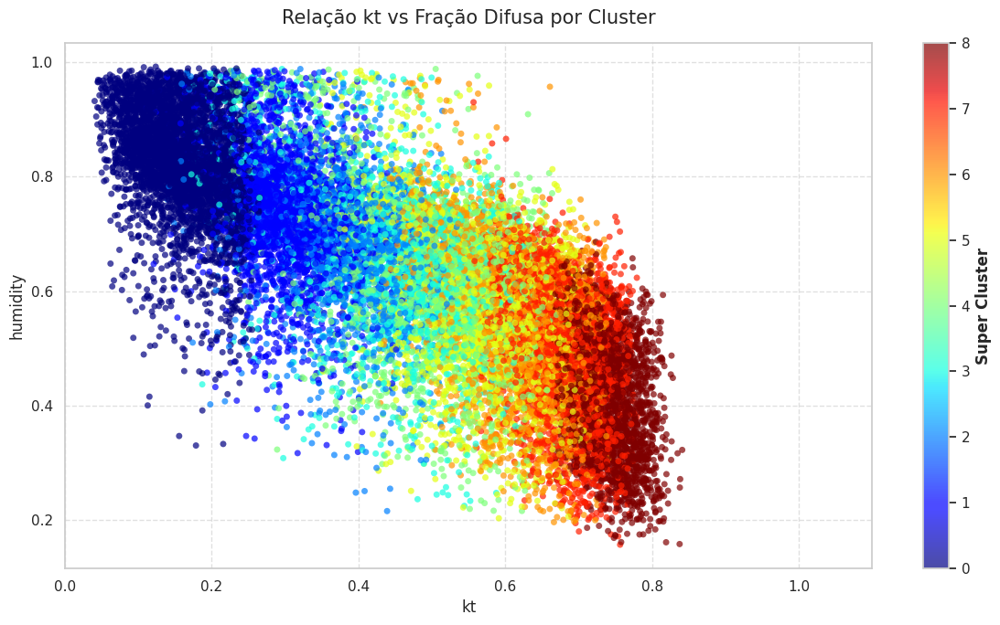

In [150]:
import matplotlib.pyplot as plt

# Filtragem dos dados
df_plot = df_processed.loc[(df_processed['mask'] == 1) &
                           (df_processed['cloud_enh'] == 0)]

# Criando a figura e os eixos de forma explícita
fig, ax = plt.subplots(figsize=(12, 7))

# Plotando o scatter
# s=20 define o tamanho dos pontos, alpha a transparência para ver sobreposição
scatter = ax.scatter(
    data=df_plot, 
    x='kt', 
    y='humidity', 
    c='super_cluster', 
    cmap='jet',      # 'jet' com 9 níveis pode ser passado direto ou via cm.get_cmap
    s=25, 
    alpha=0.7,
    edgecolors='none'
)

# Adicionando e configurando a barra de cores (colorbar)
cbar = fig.colorbar(scatter, ax=ax)
cbar.set_label('Super Cluster', fontsize=12, fontweight='bold')


# Melhorando a estética do gráfico
ax.set_title('Relação kt vs Fração Difusa por Cluster', fontsize=15, pad=15)
ax.set_xlabel('kt', fontsize=12)
ax.set_ylabel('humidity', fontsize=12)
ax.grid(True, linestyle='--', alpha=0.6)

ax.set_xlim(0,1.1)

plt.tight_layout()
plt.show()


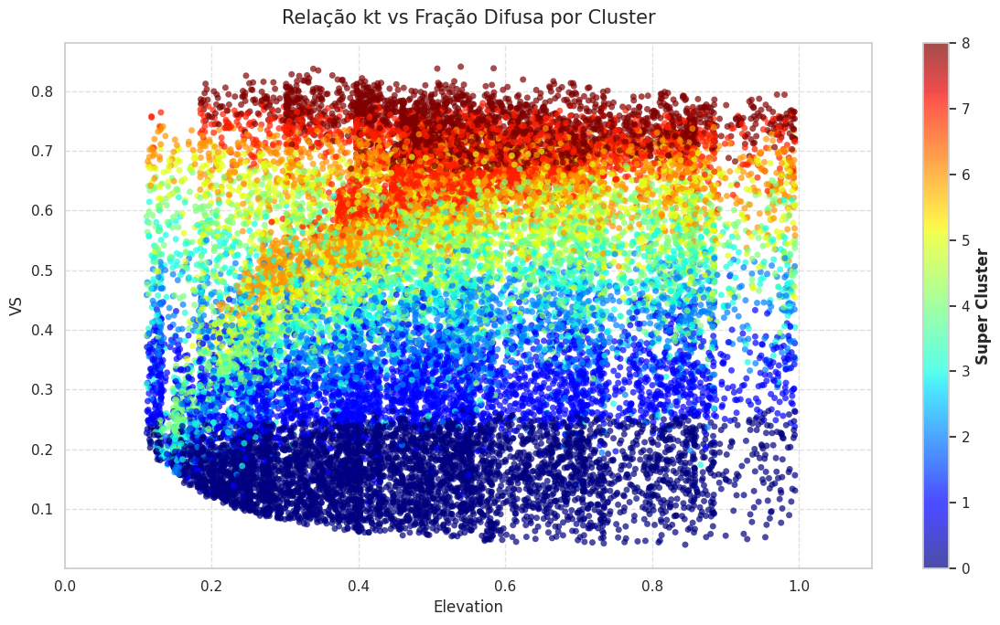

In [148]:
import matplotlib.pyplot as plt

# Filtragem dos dados
df_plot = df_processed.loc[(df_processed['mask'] == 1) &
                           (df_processed['cloud_enh'] == 0)]

# Criando a figura e os eixos de forma explícita
fig, ax = plt.subplots(figsize=(12, 7))

# Plotando o scatter
# s=20 define o tamanho dos pontos, alpha a transparência para ver sobreposição
scatter = ax.scatter(
    data=df_plot, 
    x='elevation', 
    y='kt', 
    c='super_cluster', 
    cmap='jet',      # 'jet' com 9 níveis pode ser passado direto ou via cm.get_cmap
    s=25, 
    alpha=0.7,
    edgecolors='none'
)

# Adicionando e configurando a barra de cores (colorbar)
cbar = fig.colorbar(scatter, ax=ax)
cbar.set_label('Super Cluster', fontsize=12, fontweight='bold')


# Melhorando a estética do gráfico
ax.set_title('Relação kt vs Fração Difusa por Cluster', fontsize=15, pad=15)
ax.set_xlabel('Elevation', fontsize=12)
ax.set_ylabel('VS', fontsize=12)
ax.grid(True, linestyle='--', alpha=0.6)

ax.set_xlim(0,1.1)

plt.tight_layout()
plt.show()


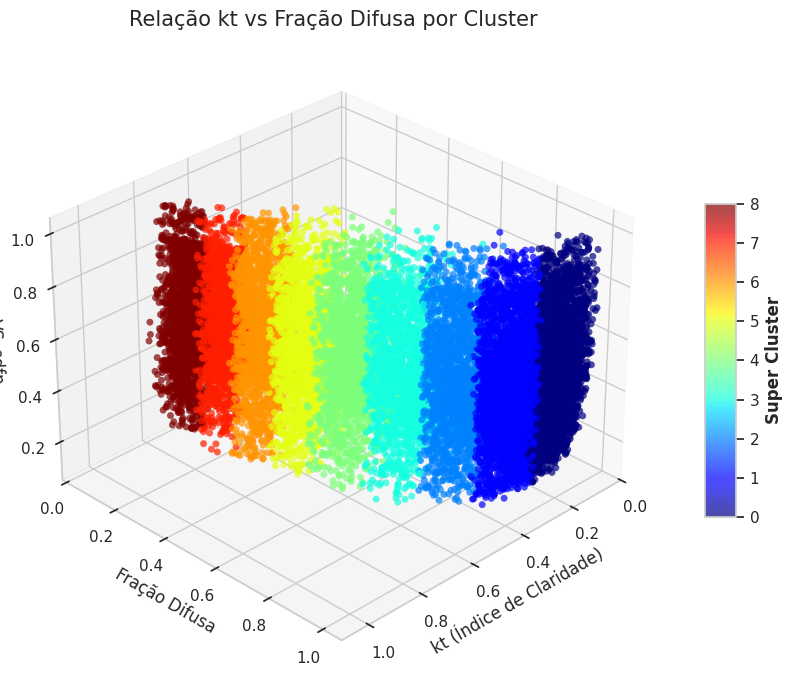

In [129]:
import matplotlib.pyplot as plt

# Filtragem
df_plot = df_processed.loc[(df_processed['mask'] == 1) &
                           (df_processed['cloud_enh'] == 0)]

fig = plt.figure(figsize=(12, 7))
ax = fig.add_subplot(projection='3d')

# No scatter 3D, passamos x, y, z como os 3 primeiros argumentos posicionais
scatter = ax.scatter(
    df_plot['kt'], 
    df_plot['fracao_difusa'], 
    df_plot['elevation'],
    c=df_plot['super_cluster'], 
    cmap='jet',
    s=25, 
    alpha=0.7,
    edgecolors='none'
)

# Colorbar
cbar = fig.colorbar(scatter, ax=ax, shrink=0.5, aspect=10) # shrink ajusta o tamanho da barra
cbar.set_label('Super Cluster', fontsize=12, fontweight='bold')

# Estética e Labels
ax.set_title('Relação kt vs Fração Difusa por Cluster', fontsize=15, pad=15)
ax.set_xlabel('kt (Índice de Claridade)')
ax.set_ylabel('Fração Difusa')
ax.set_zlabel('VS_cdfn') # Adicionado label para o eixo Z

# Limites e Grid
ax.set_xlim(0, 1.1)
# O grid no 3D funciona de forma diferente, o padrão do Matplotlib já é razoável
ax.view_init(elev = 30, azim =45)
plt.tight_layout()
plt.show()


In [ ]:
x = df_processed.loc[(df_processed['mask'] == 1) &
                    (df_processed['cloud_enh'] == 0)].groupby('super_cluster').agg({
        'kt':['mean', 'std'],
        'fracao_difusa':['mean', 'std'],
        'VS_cdfn':['mean','std']
    })

x['QS2'] = 1 - np.sqrt((1-x['kt']['mean'])**2 + x['fracao_difusa']['mean']**2)/np.sqrt(2)
x['QS3'] = 1 - np.sqrt((1-x['kt']['mean'])**2 + x['fracao_difusa']['mean']**2 + x['VS_cdfn']['mean']**2)/np.sqrt(3)

#x

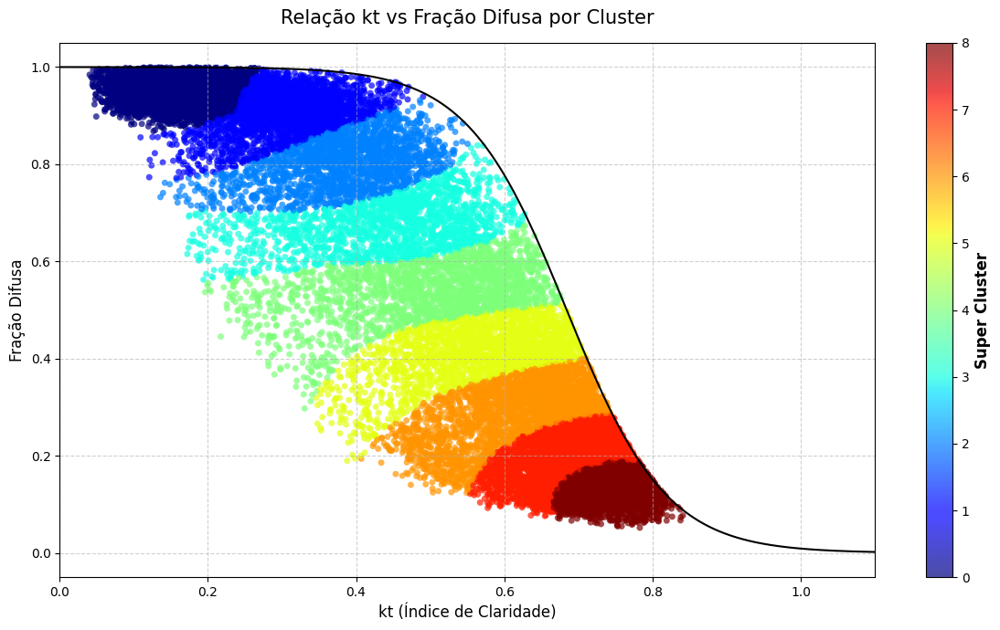

In [13]:
import matplotlib.pyplot as plt

# Filtragem dos dados
df_plot = df_processed.loc[(df_processed['mask'] == 1) & 
                           (df_processed['cloud_enh'] == 0)]

# Criando a figura e os eixos de forma explícita
fig, ax = plt.subplots(figsize=(12, 7))

# Plotando o scatter
# s=20 define o tamanho dos pontos, alpha a transparência para ver sobreposição
scatter = ax.scatter(
    data=df_plot, 
    x='kt', 
    y='fracao_difusa', 
    c='super_cluster', 
    cmap='jet',      # 'jet' com 9 níveis pode ser passado direto ou via cm.get_cmap
    s=25, 
    alpha=0.7,
    edgecolors='none'
)

# Adicionando e configurando a barra de cores (colorbar)
cbar = fig.colorbar(scatter, ax=ax)
cbar.set_label('Super Cluster', fontsize=12, fontweight='bold')

ax.plot(
        df_cloud['kt'],
        df_cloud['threshold'],
        color='black')

# Melhorando a estética do gráfico
ax.set_title('Relação kt vs Fração Difusa por Cluster', fontsize=15, pad=15)
ax.set_xlabel('kt (Índice de Claridade)', fontsize=12)
ax.set_ylabel('Fração Difusa', fontsize=12)
ax.grid(True, linestyle='--', alpha=0.6)

ax.set_xlim(0,1.1)

plt.tight_layout()
plt.show()


In [ ]:
sc = sorted(df_processed['super_cluster'].unique())

for c in sc:
    x = df_processed[['mean', 'fracao_difusa']].loc[df_processed['super_cluster'] == c]

[0, 1, 2, 3, 4, 5, 6, 7, 8]

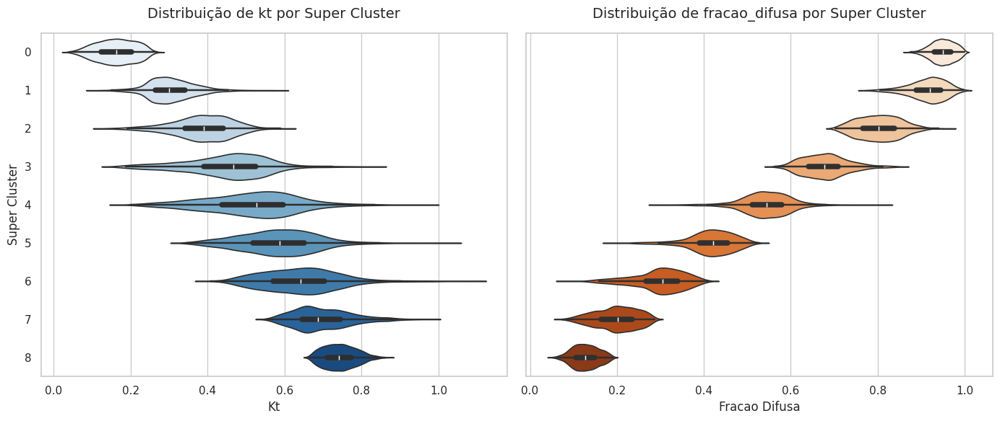

In [48]:
import matplotlib.pyplot as plt
import seaborn as sns

# Configurações estéticas globais
sns.set_theme(style="whitegrid")
df_filtered = df_processed.loc[df_processed['mask'] == 1]

# Criando a moldura com 1 linha e 2 colunas
fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharey=True)

# Lista de variáveis para o eixo X
vars_x = ['kt', 'fracao_difusa']
paletas = ['Blues', 'Oranges'] # Cores diferentes para diferenciar os índices

for i, var in enumerate(vars_x):
    sns.violinplot(
        data=df_filtered,
        x=var,
        y='super_cluster',
        ax=axes[i],
        orient='h',
        palette=paletas[i],
        linewidth=1.2,      # Linhas mais finas e elegantes
        #fliersize=3,        # Tamanho reduzido dos outliers
        width=0.7           # Largura das caixas
    )
    
    # Ajustes de títulos e eixos
    axes[i].set_title(f'Distribuição de {var} por Super Cluster', fontsize=14, pad=15)
    axes[i].set_xlabel(var.replace('_', ' ').title(), fontsize=12)
    axes[i].set_ylabel('Super Cluster' if i == 0 else '', fontsize=12)

# Ajusta o espaçamento para não cortar os nomes
plt.tight_layout()
plt.show()


In [55]:
df_processed.columns

Index(['target', 'ghi', 'irrad_poa', 'temp_amb', 'humidity', 'wind_speed',
       'Pressão Baromêtrica mm Hg', 'Pluviômetro mm', 'zenith',
       'apparent_zenith', 'azimuth', 'elevation', 'extra_rad', 'dni_extra',
       'am_abs', 'cos_zenith', 'sin_azimuth', 'ghi_extra', 'is_clear_moment',
       'is_clear_day', 'linke_turbidity_calc', 'dhi_cs', 'ghi_cs', 'dni_cs',
       'kt', 'direct_fraction', 'k', 'QS', 'VS_cdfn', 'temp_cell', 'pot_cs',
       'dhi', 'fracao_difusa', 'dni', 'mask', 'P_fracao_difusa', 'P_kt', 'P1',
       'P2', 'P3', 'irr_clearsky_ratio', 'delta_kt', 'delta_fracao_difusa',
       'cluster', 'super_cluster', 'cloud_enh', 'QS2', 'QS3'],
      dtype='object')

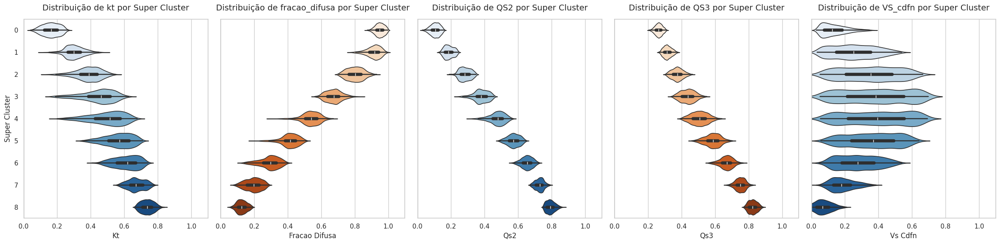

In [58]:
import matplotlib.pyplot as plt
import seaborn as sns

# Configurações estéticas globais
sns.set_theme(style="whitegrid")
df_filtered = df_processed.loc[(df_processed['mask'] == 1) & 
                               (df_processed['cloud_enh'] == 0)]



# Lista de variáveis para o eixo X
vars_x = ['kt', 'fracao_difusa',  'QS2', 'QS3', 'VS_cdfn']
paletas = ['Blues', 'Oranges', 'Blues', 'Oranges', 'Blues'] # Cores diferentes para diferenciar os índices

# Criando a moldura com 1 linha e 2 colunas
fig, axes = plt.subplots(1, len(vars_x), figsize=(24, 6), sharey=True)

for i, var in enumerate(vars_x):
    sns.violinplot(
        data=df_filtered,
        x=var,
        y='super_cluster',
        ax=axes[i],
        orient='h',
        palette=paletas[i],
        linewidth=1.2,      # Linhas mais finas e elegantes
        #fliersize=3,        # Tamanho reduzido dos outliers
        width=0.7           # Largura das caixas
    )
    
    # Ajustes de títulos e eixos
    axes[i].set_title(f'Distribuição de {var} por Super Cluster', fontsize=14, pad=15)
    axes[i].set_xlabel(var.replace('_', ' ').title(), fontsize=12)
    axes[i].set_ylabel('Super Cluster' if i == 0 else '', fontsize=12)
    axes[i].set_xlim(0,1.1)

# Ajusta o espaçamento para não cortar os nomes
plt.tight_layout()
plt.show()


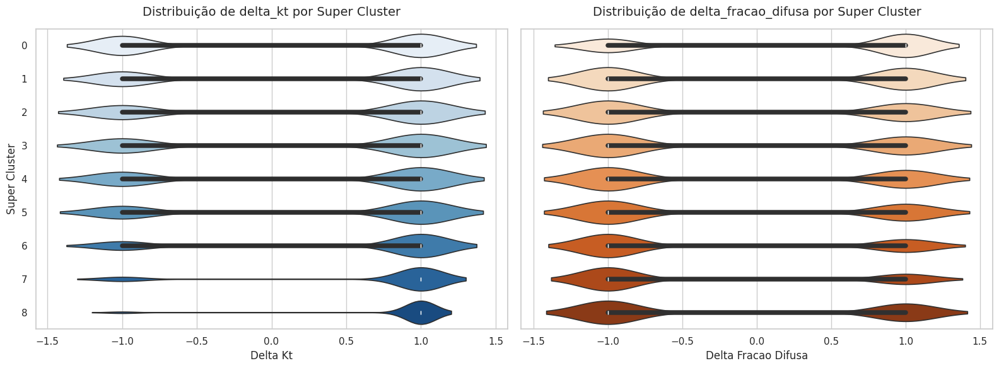

In [65]:
import matplotlib.pyplot as plt
import seaborn as sns

# Configurações estéticas globais
sns.set_theme(style="whitegrid")
df_filtered = df_processed.loc[(df_processed['mask'] == 1) & 
                               (df_processed['cloud_enh'] == 0)]



# Lista de variáveis para o eixo X
vars_x = ['delta_kt', 'delta_fracao_difusa']
paletas = ['Blues', 'Oranges'] # Cores diferentes para diferenciar os índices

# Criando a moldura com 1 linha e 2 colunas
fig, axes = plt.subplots(1, len(vars_x), figsize=(16, 6), sharey=True)

for i, var in enumerate(vars_x):
    sns.violinplot(
        data=df_filtered,
        x=np.sign(df_filtered[var].values),
        y='super_cluster',
        ax=axes[i],
        orient='h',
        palette=paletas[i],
        linewidth=1.2,      # Linhas mais finas e elegantes
        #fliersize=3,        # Tamanho reduzido dos outliers
        width=0.7           # Largura das caixas
    )
    
    # Ajustes de títulos e eixos
    axes[i].set_title(f'Distribuição de {var} por Super Cluster', fontsize=14, pad=15)
    axes[i].set_xlabel(var.replace('_', ' ').title(), fontsize=12)
    axes[i].set_ylabel('Super Cluster' if i == 0 else '', fontsize=12)
    #axes[i].set_xlim(0,1.1)

# Ajusta o espaçamento para não cortar os nomes
plt.tight_layout()
plt.show()


In [66]:
var

'delta_fracao_difusa'

In [ ]:
var = 'kt'
passado = df_processed['kt'].diff()/df_processed['fracao_difusa'].diff()
df_processed ['delta_theta']= np.arctan2(df_processed['fracao_difusa'].diff(),df_processed['kt'].diff())/(2*np.pi)
#x.iloc[16:18]*180/np.pi

In [104]:
df_processed[['kt', 'fracao_difusa']].iloc[16:18]

,kt,fracao_difusa
Date_Time,,
2015-06-12 10:00:00-03:00,0.209053,1.007246
2015-06-12 11:00:00-03:00,0.226567,0.987063


In [99]:
np.arctan2(1,1)

0.7853981633974483

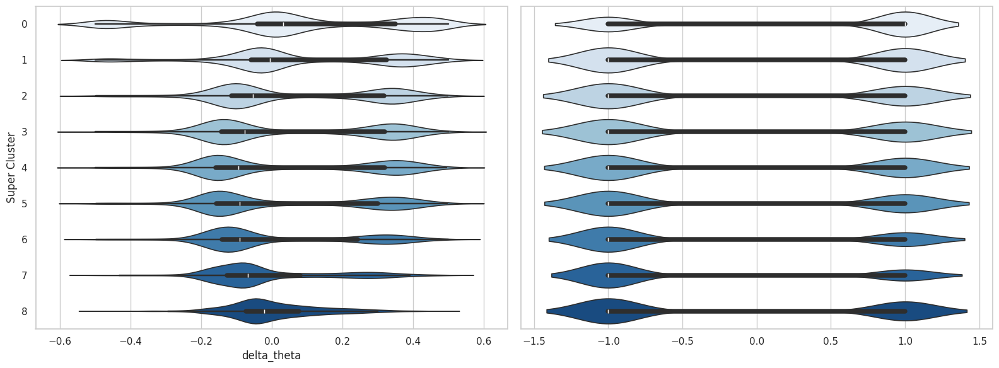

In [108]:
import matplotlib.pyplot as plt
import seaborn as sns

# Configurações estéticas globais
sns.set_theme(style="whitegrid")
df_filtered = df_processed.loc[(df_processed['mask'] == 1) & 
                               (df_processed['cloud_enh'] == 0)]



# Lista de variáveis para o eixo X
vars_x = ['delta_theta', np.sign(df_filtered['delta_theta'].values)]
paletas = ['Blues','Blues'] # Cores diferentes para diferenciar os índices

# Criando a moldura com 1 linha e 2 colunas
fig, axes = plt.subplots(1, len(vars_x), figsize=(16, 6), sharey=True)

for i, var in enumerate(vars_x):
    sns.violinplot(
        data=df_filtered,
        x=var,
        y='super_cluster',
        ax=axes[i],
        orient='h',
        palette=paletas[i],
        linewidth=1.2,      # Linhas mais finas e elegantes
        #fliersize=3,        # Tamanho reduzido dos outliers
        width=0.7           # Largura das caixas
    )
    
    # Ajustes de títulos e eixos
    #axes[i].set_title(f'Distribuição de {var} por Super Cluster', fontsize=14, pad=15)
    #axes[i].set_xlabel(var.replace('_', ' ').title(), fontsize=12)
    axes[i].set_ylabel('Super Cluster' if i == 0 else '', fontsize=12)
    #axes[i].set_xlim(0,1.1)

# Ajusta o espaçamento para não cortar os nomes
plt.tight_layout()
plt.show()


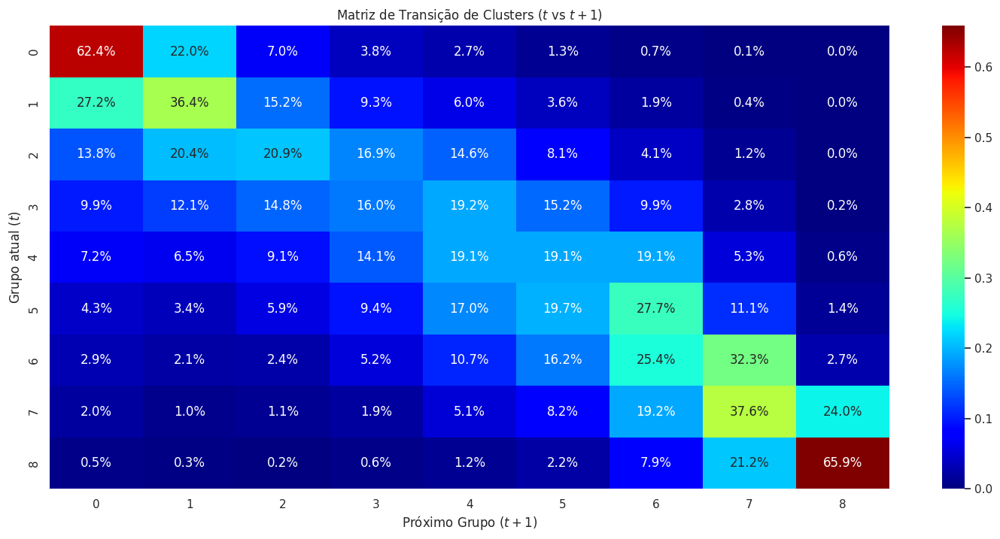

In [97]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Supondo que você tenha seus labels ordenados pelo tempo
# Pode ser os 20 clusters originais ou os macro-clusters finais
# labels_tempo = [0, 1, 1, 0, 0, 1, ...] 


# Criamos um DataFrame com o estado atual (t)
df_sequencia = pd.DataFrame({'t': df_processed['super_cluster'].loc[df_processed['mask'] == 1]})

# 2. Criamos a coluna (t+1) deslocando os dados uma linha para cima (shift)
df_sequencia['t+1'] = df_sequencia['t'].shift(-1)

# A última linha ficará vazia (NaN) no t+1, então nós a removemos
df_sequencia = df_sequencia.dropna()

# Como o shift transforma para float por causa do NaN, voltamos para int
df_sequencia['t+1'] = df_sequencia['t+1'].astype(int)

# 3. Criar a Matriz de Transição usando crosstab
# O primeiro argumento vai para o eixo Y (t), o segundo para o eixo X (t+1)
matriz_transicao = pd.crosstab(df_sequencia['t'], df_sequencia['t+1'], normalize='index')

# 4. Visualizar com um Heatmap para facilitar a análise
plt.figure(figsize=(18, 8))
# annot=True mostra os números dentro dos quadrados, cmap define a cor
sns.heatmap(matriz_transicao, annot=True, fmt='.1%', cmap='jet')

plt.title('Matriz de Transição de Clusters ($t$ vs $t+1$)')
plt.ylabel('Grupo atual ($t$)')
plt.xlabel('Próximo Grupo ($t+1$)')
plt.show()

## Forecast cluster

### XGboost

### LSTM

#### Montagem das Rolling Windows

In [17]:
sys.path.append(os.path.abspath(os.path.join(os.getcwd(), '..')))
from domains.previsao_ceu.dataset import SolarEfficientDataset

In [21]:
# 5. Split Temporal (Último Ano = Teste)
#last_year = df_processed.index.year.max() <---- REMOVER FUTURAMENTE
last_year = CONFIG['test_year']
print(f"📅 Separando ano {last_year} para TESTE.")

test_df = df_processed[df_processed.index.year == last_year].copy()
dev_df = df_processed[df_processed.index.year < last_year].copy()

if dev_df.empty:
    raise ValueError("❌ Erro no Split: Dados insuficientes antes do último ano.")

# Split Treino/Validação
n_dev = len(dev_df)
train_end = int(n_dev * CONFIG['split_ratios']['train'])

train_df = dev_df.iloc[:train_end].copy()
val_df = dev_df.iloc[train_end:].copy()

print(f"📊 Divisão: Treino={len(train_df)} | Val={len(val_df)} | Teste={len(test_df)}")

train_dataset = SolarEfficientDataset(
    df=train_df, 
    feature_cols=CONFIG['feature_cols'], 
    target_col=CONFIG['target_col'],
    aux_col=CONFIG['aux_col'],
    n_past=CONFIG['input_seq_len'], 
    n_future=CONFIG['output_seq_len'],
    cloud_enhancement=True
)
val_dataset = SolarEfficientDataset(
    df=val_df, 
    feature_cols=CONFIG['feature_cols'], 
    target_col=CONFIG['target_col'],
    aux_col=CONFIG['aux_col'],
    n_past=CONFIG['input_seq_len'], 
    n_future=CONFIG['output_seq_len'],
    cloud_enhancement=True
)
test_dataset = SolarEfficientDataset(
    df=test_df, 
    feature_cols=CONFIG['feature_cols'], 
    target_col=CONFIG['target_col'],
    aux_col=CONFIG['aux_col'],
    n_past=CONFIG['input_seq_len'], 
    n_future=CONFIG['output_seq_len'],
    cloud_enhancement=True
)

train_loader = DataLoader(train_dataset, batch_size=CONFIG['batch_size'], shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=CONFIG['batch_size'], shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=CONFIG['batch_size'], shuffle=True)


📅 Separando ano 2022 para TESTE.
📊 Divisão: Treino=45985 | Val=11497 | Teste=8760
✅ Dataset pronto. Amostras válidas: 15026
✅ Dataset pronto. Amostras válidas: 4219
✅ Dataset pronto. Amostras válidas: 3004


#### Treinamento do modelo

In [22]:
sys.path.append(os.path.abspath(os.path.join(os.getcwd(), '..')))
from core.models.stacked_rnn import Stacked_RNN

model = Stacked_RNN(
            input_size=len(CONFIG['feature_cols']),            
            hidden_sizes=CONFIG['hidden_sizes'], 
            output_size=20,
            cell_type=CONFIG['cell_type'],           
            bidirectional=CONFIG['bidirectional']).to(DEVICE)

criterion = nn.CrossEntropyLoss()

optimizer = optim.Adam(model.parameters(), lr=CONFIG['learning_rate'])
early_stopping = EarlyStopping(patience=CONFIG['patience'], verbose=True, path=os.path.join(exp_dir, 'best_model.pt'))

print("🔥 Iniciando épocas...")
train_losses, val_losses = [], []

for epoch in range(CONFIG['epochs']):
    model.train()

    # treino
    batch_losses = []
    for x, y, _, _ in train_loader:
        x, y = x.to(DEVICE), y.to(DEVICE).squeeze().long()
        optimizer.zero_grad()
        out = model(x)
        loss = criterion(out, y)
        loss.backward()
        optimizer.step()
        batch_losses.append(loss.item())

    avg_train = np.mean(batch_losses)
    train_losses.append(avg_train)

    model.eval()

    # validação
    val_batch_losses = []
    correct_preds = 0
    total_samples = 0
    with torch.no_grad():
        for x, y, _, _ in val_loader:
            x, y = x.to(DEVICE), y.to(DEVICE).squeeze().long()
            out = model(x)
            # Extrai a classe com maior probabilidade
            _, preds = torch.max(out, 1)
            
            loss = criterion(out, y)
            
            val_batch_losses.append(loss.item())
    
    avg_val = np.mean(val_batch_losses)
    val_losses.append(avg_val)
    
    print(f"Epoch {epoch+1} | Train: {avg_train:.6f} | Val: {avg_val:.6f}") 

    early_stopping(avg_val, model)
    if early_stopping.early_stop:
        print("🛑 Early stopping.")
        break

🔥 Iniciando épocas...
Epoch 1 | Train: 2.041890 | Val: 1.812611
Validation loss decreased (inf --> 1.812611).  Saving model ...
Epoch 2 | Train: 1.684460 | Val: 1.693920
Validation loss decreased (1.812611 --> 1.693920).  Saving model ...
Epoch 3 | Train: 1.599422 | Val: 1.621793
Validation loss decreased (1.693920 --> 1.621793).  Saving model ...
Epoch 4 | Train: 1.537774 | Val: 1.579104
Validation loss decreased (1.621793 --> 1.579104).  Saving model ...
Epoch 5 | Train: 1.495511 | Val: 1.549546
Validation loss decreased (1.579104 --> 1.549546).  Saving model ...
Epoch 6 | Train: 1.467668 | Val: 1.524252
Validation loss decreased (1.549546 --> 1.524252).  Saving model ...
Epoch 7 | Train: 1.449359 | Val: 1.518075
Validation loss decreased (1.524252 --> 1.518075).  Saving model ...
Epoch 8 | Train: 1.432806 | Val: 1.506835
Validation loss decreased (1.518075 --> 1.506835).  Saving model ...
Epoch 9 | Train: 1.422160 | Val: 1.495564
Validation loss decreased (1.506835 --> 1.495564).  S

### Analise de resultados

--------------------------------------------------
📊 RESULTADOS NA BASE DE TESTE
--------------------------------------------------
Test Loss: 1.403232
Test Accuracy: 0.4344

Relatório de Classificação:
              precision    recall  f1-score   support

           0       0.62      0.65      0.63       448
           1       0.34      0.51      0.41       356
           2       0.19      0.14      0.16       225
           3       0.24      0.05      0.08       216
           4       0.31      0.13      0.18       264
           5       0.22      0.29      0.25       307
           6       0.34      0.45      0.38       386
           7       0.57      0.48      0.52       463
           8       0.72      0.81      0.76       339

    accuracy                           0.43      3004
   macro avg       0.40      0.39      0.38      3004
weighted avg       0.43      0.43      0.42      3004



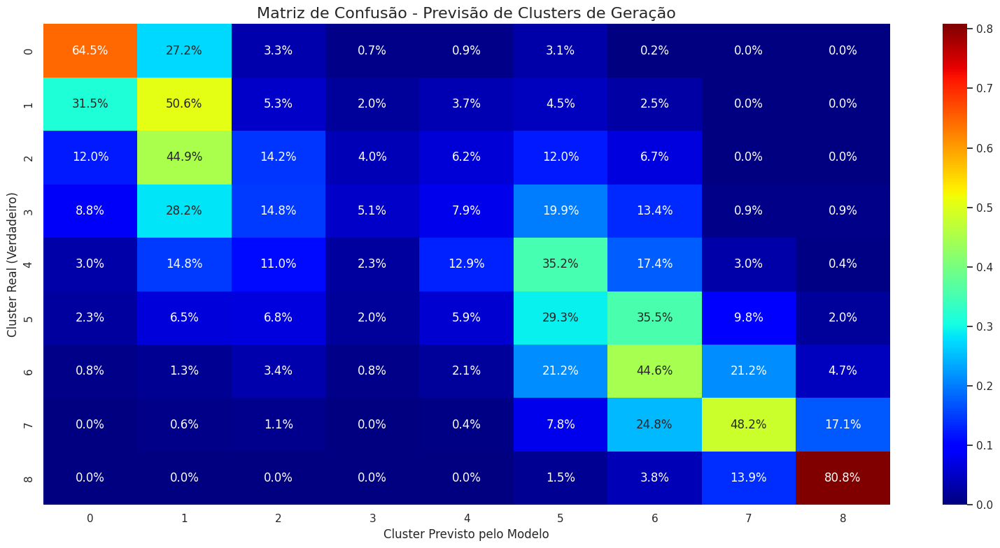

In [23]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix

model.eval() # Coloca o modelo em modo de inferência (desliga Dropout, etc.)

# Listas para armazenar os resultados reais e previstos
all_preds = []
all_targets = []
test_batch_losses = []

# 2. Loop de Avaliação na Base de Teste
with torch.no_grad(): # Desliga o cálculo de gradientes (economiza memória e fica mais rápido)
    for x, y, _, _ in test_loader:
        x = x.to(DEVICE)
        
        # Garante que y seja 1D e esteja no formato correto, igual fizemos no treino
        y = y.to(DEVICE).view(-1).long()
        
        # Passagem pela rede
        out = model(x)
        
        # Calcula a loss apenas para registro
        loss = criterion(out, y)
        test_batch_losses.append(loss.item())
        
        # Extrai a classe prevista (o índice do neurônio com maior probabilidade)
        _, preds = torch.max(out, 1)
        
        # Move os tensores de volta para a CPU e converte para listas do numpy
        all_preds.extend(preds.cpu().numpy())
        all_targets.extend(y.cpu().numpy())

# Converte para arrays numpy para usar no Scikit-Learn
all_preds = np.array(all_preds)
all_targets = np.array(all_targets)

# 3. Cálculo das Métricas
avg_test_loss = np.mean(test_batch_losses)
test_acc = accuracy_score(all_targets, all_preds)

print("-" * 50)
print(f"📊 RESULTADOS NA BASE DE TESTE")
print("-" * 50)
print(f"Test Loss: {avg_test_loss:.6f}")
print(f"Test Accuracy: {test_acc:.4f}\n")

# Relatório completo (Precision, Recall, F1-Score para cada cluster)
print("Relatório de Classificação:")
print(classification_report(all_targets, all_preds, zero_division=0))

# 4. Plotagem da Matriz de Confusão
plt.figure(figsize=(16, 8))
#cm = confusion_matrix(all_targets, all_preds)
cm = confusion_matrix(all_targets, all_preds, normalize='true')

# Cria um Heatmap usando o Seaborn
sns.heatmap(cm, annot=True, fmt='.1%', cmap='jet', 
            xticklabels=range(9), 
            yticklabels=range(9))

plt.title('Matriz de Confusão - Previsão de Clusters de Geração', fontsize=16)
plt.ylabel('Cluster Real (Verdadeiro)', fontsize=12)
plt.xlabel('Cluster Previsto pelo Modelo', fontsize=12)
plt.tight_layout()
plt.show()

In [112]:
test_dataset[40]

(tensor([[0.1397, 0.9666, 0.5108, 0.7159, 0.8530, 0.2566],
         [0.2050, 0.9885, 0.6624, 0.7323, 0.7970, 0.2331]]),
 tensor([[1.]]),
 tensor([1.]),
 tensor([[9.7875e+02, 9.5804e-01, 8.1492e-01, 1.3547e+03]]))

<Axes: xlabel='kt', ylabel='fracao_difusa'>

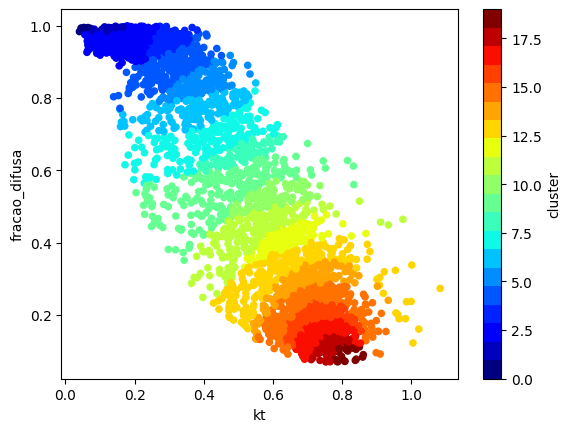

In [32]:
import matplotlib as mlp
cmap = mlp.cm.get_cmap('jet', 20)

test_df.loc[test_df['mask'] == 1].plot.scatter('kt', 'fracao_difusa', c='cluster', cmap=cmap)

In [11]:

print(f"\n📂 Processando: {os.path.basename(exp_dir)}")

# 1. Configurações e Preprocessor
config = get_config(exp_dir)
#pp_params = get_preprocessing_params(config)

# 2. Carga de Dados
# 4. Dataset (Configurado para retornar x, y, mask e aux)
#n_past = config['input_seq_len']
n_future = config['output_seq_len']

# 5. Inicialização do Modelo (output_dim dinâmico)
"""
model = EncDecModel(
    input_size=len(config['feature_cols']),
    hidden_sizes=config['hidden_sizes'],
    output_seq_len=n_future,
    output_dim=len(config['target_col']), # Agora aceita multi-output
    cell_type=config.get('cell_type', 'gru'),
    bidirectional=config.get('bidirectional', False),
    use_attention=config.get('use_attention', False),
    use_feature_attention=config.get('use_feature_attention', False)
).to(DEVICE)
"""

# Carrega os pesos
"""
w_path = os.path.join(exp_dir, 'best_model.pt')
if not os.path.exists(w_path): w_path = os.path.join(exp_dir, 'best_model.pth')
model.load_state_dict(torch.load(w_path, map_location=DEVICE), strict=False)
model.eval()
"""
# 6. Inferência Multi-Output
print("   🔮 Gerando previsões...")
preds_list, reals_list, aux_list = [], [], []

with torch.no_grad():
    for batch_x, batch_y, batch_mask, batch_aux, batch_gp in loader:
        out = model(batch_x.to(DEVICE))
        
        # Guardamos as predições, os reais e os metadados físicos
        preds_list.append(out.cpu().numpy())
        reals_list.append(batch_y.cpu().numpy())
        aux_list.append(batch_aux.cpu().numpy())

# Concatenamos os resultados: Shape esperado [N_amostras, Seq_Futura, Variaveis]
y_pred_all = np.concatenate(preds_list, axis=0)
y_true_all = np.concatenate(reals_list, axis=0)
aux_all = np.concatenate(aux_list, axis=0)

# Criamos o DataFrame com kt e kd (Reais e Preditos)
# Assumindo a ordem do target_col no CONFIG: [kt, fracao_difusa]
df_analysis = pd.DataFrame({
    'kt_real': y_true_all[:, 0, 0],
    'kd_real': y_true_all[:, 0, 1],
    'kt_pred': y_pred_all[:, 0, 0],
    'kd_pred': y_pred_all[:, 0, 1],
})


print(f"   ✅ DataFrame de análise gerado com {len(df_analysis)} timesteps diurnos.")



return x[['kt_real', 'kd_real', 'kt_pred', 'kd_pred', 'P_fracao_difusa', 'P_kt']], os.path.basename(exp_dir), model

tensor([9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9,
        9, 9, 9, 9, 9, 9, 9, 9], device='cuda:0')